# Baseline

In [1]:
import numpy as np
import pandas as pd
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split

In [2]:
!pip freeze | grep "numpy\|pandas\|lightgbm\|scikit-learn"

"grep" ­Ґ пў«пҐвбп ў­гваҐ­­Ґ© Ё«Ё ў­Ґи­Ґ©
Є®¬ ­¤®©, ЁбЇ®«­пҐ¬®© Їа®Ја ¬¬®© Ё«Ё Ї ЄҐв­л¬ д ©«®¬.


## Загрузка данных

In [3]:
train_df = pd.read_parquet("train_data.pqt")
test_df = pd.read_parquet("test_data.pqt")

In [4]:
train_df.head(3)

,id,date,balance_amt_avg,balance_amt_max,balance_amt_min,balance_amt_day_avg,channel_code,city,city_type,index_city_code,...,cnt_cred_g_oper_3m,cnt_days_cred_g_oper_3m,sum_deb_h_oper_3m,cnt_deb_h_oper_3m,cnt_days_deb_h_oper_3m,sum_cred_h_oper_3m,cnt_cred_h_oper_3m,cnt_days_cred_h_oper_3m,start_cluster,end_cluster
0,0,month_1,0.744845,0.705492,1.287207,0.748101,channel_code_5,city_23,city_type_0,index_city_code_39,...,0.951166,0.568681,0.897565,0.553624,0.774354,0.936506,0.295984,0.967947,"{α, γ}",{other}
1,0,month_2,1.049605,0.831916,2.458609,1.053805,channel_code_5,city_23,city_type_0,index_city_code_39,...,0.948812,0.499716,0.785029,0.551904,0.696576,0.990157,0.298873,0.945969,"{α, γ}",{other}
2,0,month_3,0.692653,0.740253,0.430042,0.695747,channel_code_5,city_23,city_type_0,index_city_code_39,...,0.946458,0.442244,0.877050,0.551044,0.663243,0.810065,0.294829,0.956958,"{α, γ}",{other}


In [25]:
train_df.columns

Index(['id', 'date', 'balance_amt_avg', 'balance_amt_max', 'balance_amt_min',
       'balance_amt_day_avg', 'channel_code', 'city', 'city_type',
       'index_city_code', 'ogrn_days_end_month', 'ogrn_days_end_quarter',
       'ogrn_month', 'ogrn_year', 'ft_registration_date', 'max_founderpres',
       'min_founderpres', 'ogrn_exist_months', 'okved', 'segment',
       'sum_of_paym_2m', 'sum_of_paym_6m', 'sum_of_paym_1y', 'sum_a_oper_1m',
       'cnt_a_oper_1m', 'sum_b_oper_1m', 'cnt_b_oper_1m', 'sum_c_oper_1m',
       'cnt_c_oper_1m', 'sum_deb_d_oper_1m', 'cnt_deb_d_oper_1m',
       'sum_cred_d_oper_1m', 'cnt_cred_d_oper_1m', 'sum_deb_e_oper_1m',
       'cnt_deb_e_oper_1m', 'cnt_days_deb_e_oper_1m', 'sum_cred_e_oper_1m',
       'cnt_cred_e_oper_1m', 'cnt_days_cred_e_oper_1m', 'sum_deb_f_oper_1m',
       'cnt_deb_f_oper_1m', 'cnt_days_deb_f_oper_1m', 'sum_cred_f_oper_1m',
       'cnt_cred_f_oper_1m', 'cnt_days_cred_f_oper_1m', 'sum_deb_g_oper_1m',
       'cnt_deb_g_oper_1m', 'cnt_days_de

In [5]:
test_df.head(3)

,id,date,balance_amt_avg,balance_amt_max,balance_amt_min,balance_amt_day_avg,channel_code,city,city_type,index_city_code,...,sum_cred_g_oper_3m,cnt_cred_g_oper_3m,cnt_days_cred_g_oper_3m,sum_deb_h_oper_3m,cnt_deb_h_oper_3m,cnt_days_deb_h_oper_3m,sum_cred_h_oper_3m,cnt_cred_h_oper_3m,cnt_days_cred_h_oper_3m,start_cluster
0,200000,month_4,-0.096224,0.335496,-0.125995,-0.095578,channel_code_12,city_14,city_type_0,None,...,0.010952,0.946066,0.407762,-0.153950,0.548895,0.541020,0.031742,0.257278,0.561353,{α}
1,200000,month_5,-0.024255,-0.059806,-0.124295,-0.023381,channel_code_12,city_14,city_type_0,None,...,0.006812,0.945281,0.396267,-0.150505,0.549468,0.552131,0.237817,0.264211,0.715199,{α}
2,200000,month_6,0.045988,0.049418,-0.125995,0.047079,channel_code_12,city_14,city_type_0,None,...,0.006812,0.945281,0.396267,-0.152800,0.549468,0.541020,0.387566,0.268543,0.836079,None


## Анализ данных

### info and describe исходных таблиц

In [27]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 600000 entries, 0 to 599999
Data columns (total 93 columns):
 #   Column                   Non-Null Count   Dtype   
---  ------                   --------------   -----   
 0   id                       600000 non-null  int64   
 1   date                     600000 non-null  object  
 2   balance_amt_avg          534423 non-null  float64 
 3   balance_amt_max          534423 non-null  float64 
 4   balance_amt_min          534423 non-null  float64 
 5   balance_amt_day_avg      534423 non-null  float64 
 6   channel_code             557150 non-null  category
 7   city                     521656 non-null  category
 8   city_type                521656 non-null  category
 9   index_city_code          274776 non-null  category
 10  ogrn_days_end_month      568527 non-null  float64 
 11  ogrn_days_end_quarter    568527 non-null  float64 
 12  ogrn_month               568527 non-null  category
 13  ogrn_year                568527 non-null  ca

В данных есть пропуски порядка 30% в половине столбцов. Можно будет восстановить пропуски

date и end_claster имеют тип object

In [30]:
train_df.date[0], type(train_df.date[0])

('month_1', str)

In [31]:
train_df.end_cluster[0], type(train_df.end_cluster[0])

('{other}', str)

In [32]:
train_df.start_cluster[0], type(train_df.start_cluster[0])

('{α, γ}', str)

In [34]:
pd.options.display.float_format ='{:,.2f}'.format

In [36]:
train_df_describe = train_df.describe()
train_df_describe

,id,balance_amt_avg,balance_amt_max,balance_amt_min,balance_amt_day_avg,ogrn_days_end_month,ogrn_days_end_quarter,ft_registration_date,max_founderpres,min_founderpres,...,cnt_days_deb_g_oper_3m,sum_cred_g_oper_3m,cnt_cred_g_oper_3m,cnt_days_cred_g_oper_3m,sum_deb_h_oper_3m,cnt_deb_h_oper_3m,cnt_days_deb_h_oper_3m,sum_cred_h_oper_3m,cnt_cred_h_oper_3m,cnt_days_cred_h_oper_3m
count,"600,000.00","534,423.00","534,423.00","534,423.00","534,423.00","568,527.00","568,527.00","568,640.00","264,408.00","264,408.00",...,"434,748.00","600,000.00","434,748.00","434,748.00","600,000.00","434,748.00","434,748.00","600,000.00","434,748.00","434,748.00"
mean,"99,999.50",0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,...,0.81,0.00,0.95,0.41,0.00,0.55,0.51,0.00,0.26,0.46
std,"57,735.08",1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,...,0.15,1.00,0.01,0.08,1.00,0.01,0.16,1.00,0.02,0.14
min,0.00,-0.16,-0.20,-0.13,-0.16,-1.65,-1.72,-1.08,-1.15,-1.08,...,0.73,-0.03,0.94,0.38,-0.17,0.55,0.41,-0.20,0.25,0.37
25%,"49,999.75",-0.16,-0.20,-0.13,-0.16,-0.84,-0.87,-0.76,-0.76,-0.77,...,0.73,-0.03,0.94,0.38,-0.17,0.55,0.41,-0.20,0.25,0.37
50%,"99,999.50",-0.15,-0.19,-0.12,-0.15,-0.02,-0.02,-0.32,-0.28,-0.30,...,0.75,-0.03,0.94,0.38,-0.17,0.55,0.43,-0.20,0.25,0.40
75%,"149,999.25",-0.10,-0.11,-0.11,-0.10,0.79,0.87,0.40,0.45,0.46,...,0.82,-0.03,0.94,0.40,-0.14,0.55,0.54,-0.14,0.25,0.47
max,"199,999.00",154.24,117.50,91.45,154.72,1.83,1.80,3.03,3.38,3.59,...,1.73,365.96,1.94,1.38,247.46,1.55,1.41,107.58,1.25,1.37


In [37]:
train_df_describe.balance_amt_avg # Среднемесячный остаток на счетах клиента за месяц

count   534,423.00
mean          0.00
std           1.00
min          -0.16
25%          -0.16
50%          -0.15
75%          -0.10
max         154.24
Name: balance_amt_avg, dtype: float64

Получается, что в среднем в течении месяца на счёте клинтов нет денег

Есть значения среднемесячного остатка меньше нуля, значит клинеты могут на счёте иметь отрицательный баланс

std = 1, значит это сделали специально

In [38]:
train_df_describe.balance_amt_max

count   534,423.00
mean         -0.00
std           1.00
min          -0.20
25%          -0.20
50%          -0.19
75%          -0.11
max         117.50
Name: balance_amt_max, dtype: float64

In [39]:
train_df_describe.balance_amt_min

count   534,423.00
mean         -0.00
std           1.00
min          -0.13
25%          -0.13
50%          -0.12
75%          -0.11
max          91.45
Name: balance_amt_min, dtype: float64

Видно, что смещение идёт в сторону болших значений

In [40]:
train_df_describe.balance_amt_day_avg # Среднедневной остаток на счетах клиента за месяц

count   534,423.00
mean         -0.00
std           1.00
min          -0.16
25%          -0.16
50%          -0.15
75%          -0.10
max         154.72
Name: balance_amt_day_avg, dtype: float64

In [41]:
train_df_describe.ogrn_days_end_month # Количество дней с момента регистрации ОГРН до конца месяца

count   568,527.00
mean         -0.00
std           1.00
min          -1.65
25%          -0.84
50%          -0.02
75%           0.79
max           1.83
Name: ogrn_days_end_month, dtype: float64

In [44]:
train_df_describe.sum_of_paym_2m # Сумма операций клиента за последние 2 месяца

count   451,116.00
mean          0.00
std           1.00
min          -0.27
25%          -0.27
50%          -0.24
75%          -0.11
max          92.64
Name: sum_of_paym_2m, dtype: float64

Есть отрицательные значения, значит операциии вывода средств идут со знаком минус

In [45]:
train_df_describe.sum_of_paym_6m

count   451,116.00
mean         -0.00
std           1.00
min          -0.29
25%          -0.29
50%          -0.25
75%          -0.11
max         107.04
Name: sum_of_paym_6m, dtype: float64

Есть отрицательные значения, значит операциии вывода средств идут со знаком минус

In [46]:
train_df_describe.sum_of_paym_1y # Сумма операций клиента за последний год

count   451,116.00
mean          0.00
std           1.00
min          -0.30
25%          -0.29
50%          -0.25
75%          -0.11
max         138.02
Name: sum_of_paym_1y, dtype: float64

Дальше идёт по типам операций

In [47]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 290120 entries, 0 to 290119
Data columns (total 92 columns):
 #   Column                   Non-Null Count   Dtype   
---  ------                   --------------   -----   
 0   id                       290120 non-null  int64   
 1   date                     290120 non-null  object  
 2   balance_amt_avg          260637 non-null  float64 
 3   balance_amt_max          260637 non-null  float64 
 4   balance_amt_min          260637 non-null  float64 
 5   balance_amt_day_avg      260637 non-null  float64 
 6   channel_code             270092 non-null  category
 7   city                     229508 non-null  category
 8   city_type                229128 non-null  category
 9   index_city_code          133659 non-null  category
 10  ogrn_days_end_month      275842 non-null  float64 
 11  ogrn_days_end_quarter    275842 non-null  float64 
 12  ogrn_month               275842 non-null  category
 13  ogrn_year                275842 non-null  ca

Есть пропуски

In [48]:
test_df_describe = test_df.describe()
test_df_describe

,id,balance_amt_avg,balance_amt_max,balance_amt_min,balance_amt_day_avg,ogrn_days_end_month,ogrn_days_end_quarter,ft_registration_date,max_founderpres,min_founderpres,...,cnt_days_deb_g_oper_3m,sum_cred_g_oper_3m,cnt_cred_g_oper_3m,cnt_days_cred_g_oper_3m,sum_deb_h_oper_3m,cnt_deb_h_oper_3m,cnt_days_deb_h_oper_3m,sum_cred_h_oper_3m,cnt_cred_h_oper_3m,cnt_days_cred_h_oper_3m
count,"290,120.00","260,637.00","260,637.00","260,637.00","260,637.00","275,842.00","275,842.00","275,282.00","128,928.00","128,928.00",...,"210,553.00","290,120.00","210,553.00","210,553.00","290,120.00","210,553.00","210,553.00","290,120.00","210,553.00","210,553.00"
mean,"250,005.74",-0.02,-0.02,-0.02,-0.02,-0.00,-0.01,0.03,0.04,0.03,...,0.81,0.00,0.95,0.41,-0.00,0.55,0.51,-0.01,0.26,0.45
std,"28,867.60",0.79,0.92,0.84,0.78,1.00,1.00,1.02,1.02,1.02,...,0.16,0.73,0.01,0.08,0.99,0.01,0.16,1.24,0.02,0.13
min,"200,000.00",-0.16,-0.20,-0.13,-0.16,-1.65,-1.72,-1.07,-1.15,-1.08,...,0.73,-0.03,0.94,0.38,-0.17,0.55,0.41,-0.20,0.25,0.37
25%,"225,020.75",-0.16,-0.20,-0.13,-0.16,-0.84,-0.87,-0.74,-0.74,-0.76,...,0.73,-0.03,0.94,0.38,-0.17,0.55,0.41,-0.20,0.25,0.37
50%,"249,994.00",-0.15,-0.19,-0.13,-0.15,-0.02,-0.02,-0.29,-0.24,-0.28,...,0.74,-0.03,0.94,0.38,-0.17,0.55,0.43,-0.20,0.25,0.40
75%,"275,004.00",-0.11,-0.12,-0.12,-0.11,0.79,0.83,0.45,0.51,0.50,...,0.82,-0.03,0.94,0.40,-0.15,0.55,0.54,-0.15,0.25,0.46
max,"299,999.00",77.69,169.99,90.58,77.94,1.83,1.80,3.09,3.43,3.65,...,1.73,176.64,2.33,1.43,194.80,1.15,1.42,242.03,1.84,1.37


Посмотрим есть ли большая разница между обучающими и тестовыми данными

In [49]:
dif_df_describe = train_df_describe - test_df_describe
dif_df_describe

,id,balance_amt_avg,balance_amt_max,balance_amt_min,balance_amt_day_avg,ogrn_days_end_month,ogrn_days_end_quarter,ft_registration_date,max_founderpres,min_founderpres,...,cnt_days_deb_g_oper_3m,sum_cred_g_oper_3m,cnt_cred_g_oper_3m,cnt_days_cred_g_oper_3m,sum_deb_h_oper_3m,cnt_deb_h_oper_3m,cnt_days_deb_h_oper_3m,sum_cred_h_oper_3m,cnt_cred_h_oper_3m,cnt_days_cred_h_oper_3m
count,"309,880.00","273,786.00","273,786.00","273,786.00","273,786.00","292,685.00","292,685.00","293,358.00","135,480.00","135,480.00",...,"224,195.00","309,880.00","224,195.00","224,195.00","309,880.00","224,195.00","224,195.00","309,880.00","224,195.00","224,195.00"
mean,"-150,006.24",0.02,0.02,0.02,0.02,0.00,0.01,-0.03,-0.04,-0.03,...,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.01,0.00,0.00
std,"28,867.47",0.21,0.08,0.16,0.22,-0.00,-0.00,-0.02,-0.02,-0.02,...,-0.01,0.27,-0.00,-0.00,0.01,0.00,-0.00,-0.24,-0.00,0.00
min,"-200,000.00",0.00,0.00,0.00,0.00,0.00,0.00,-0.01,-0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,"-175,021.00",0.00,0.00,0.00,0.00,0.00,0.00,-0.01,-0.02,-0.01,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,"-149,994.50",0.00,0.00,0.00,0.00,0.00,0.00,-0.03,-0.04,-0.01,...,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
75%,"-125,004.75",0.01,0.01,0.00,0.01,0.00,0.04,-0.04,-0.06,-0.04,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.01
max,"-100,000.00",76.55,-52.49,0.87,76.78,0.00,0.00,-0.05,-0.06,-0.06,...,0.00,189.32,-0.39,-0.05,52.66,0.39,-0.01,-134.45,-0.59,0.00


Небольшая разница есть можно будет проверить потом

### nunique для столбцов категорий

In [54]:
# [start_cluster, channel_code, city, city_type, index_city_code, ogrn_month, ogrn_year, okved, segment]
for col in cat_cols:
    print(f'{col} | ', test_df[col].unique())

channel_code |  ['channel_code_12', 'channel_code_9', 'channel_code_7', NaN, 'channel_code_8', ..., 'channel_code_35', 'channel_code_38', 'channel_code_25', 'channel_code_43', 'channel_code_39']
Length: 41
Categories (40, object): ['channel_code_0', 'channel_code_1', 'channel_code_10', 'channel_code_11', ..., 'channel_code_6', 'channel_code_7', 'channel_code_8', 'channel_code_9']
city |  ['city_14', 'city_76', 'city_31', NaN, 'city_53', ..., 'city_3263', 'city_6385', 'city_1059', 'city_3851', 'city_695']
Length: 3623
Categories (3622, object): ['city_0', 'city_1', 'city_10', 'city_100', ..., 'city_996', 'city_997', 'city_998', 'city_999']
city_type |  ['city_type_0', NaN, 'city_type_7557', 'city_type_640', 'city_type_119', ..., 'city_type_2481', 'city_type_5428', 'city_type_619', 'city_type_3025', 'city_type_362']
Length: 2695
Categories (2694, object): ['city_type_0', 'city_type_1', 'city_type_10', 'city_type_100', ..., 'city_type_991', 'city_type_992', 'city_type_997', 'city_type_999

### Гистограммы

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

In [56]:
def plot_bar(data, feature):
    plt.figure(figsize=(8, 6))
    data[feature].value_counts().plot(kind='bar', color='skyblue')
    plt.title(f'Гистограмма частот вариантов для {feature}')
    plt.xlabel(feature)
    plt.ylabel('Частота')
    plt.xticks(rotation=45)  # Если названия вариантов длинные, это поможет их визуализации
    plt.show()

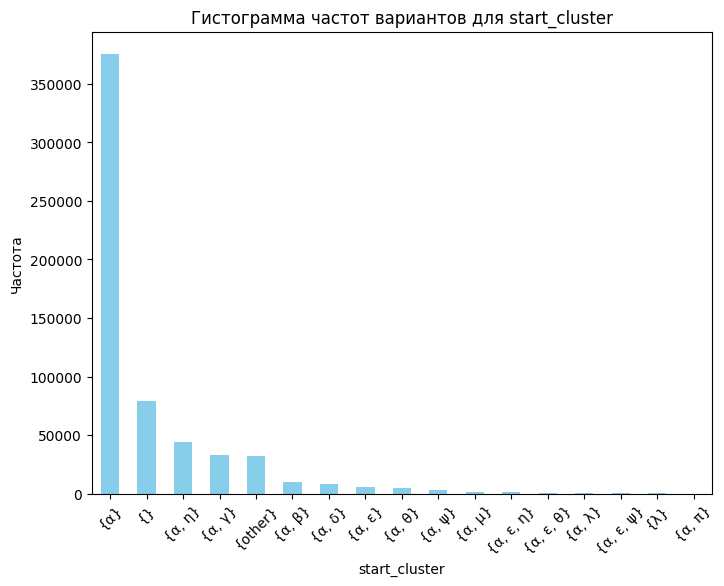

In [59]:
plot_bar(train_df, 'start_cluster')

Распределение класов похоже на логарифмическое в обучающей выборке

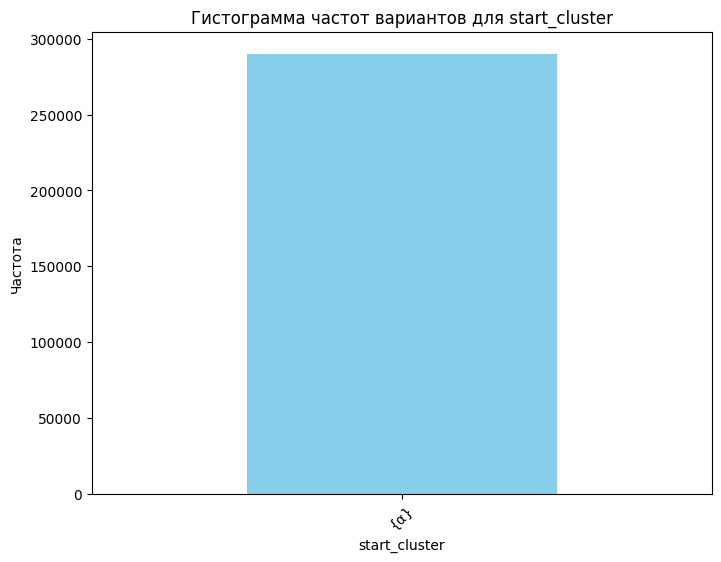

In [58]:
plot_bar(test_df, 'start_cluster')

В тестовой выборке начальный класс только один 

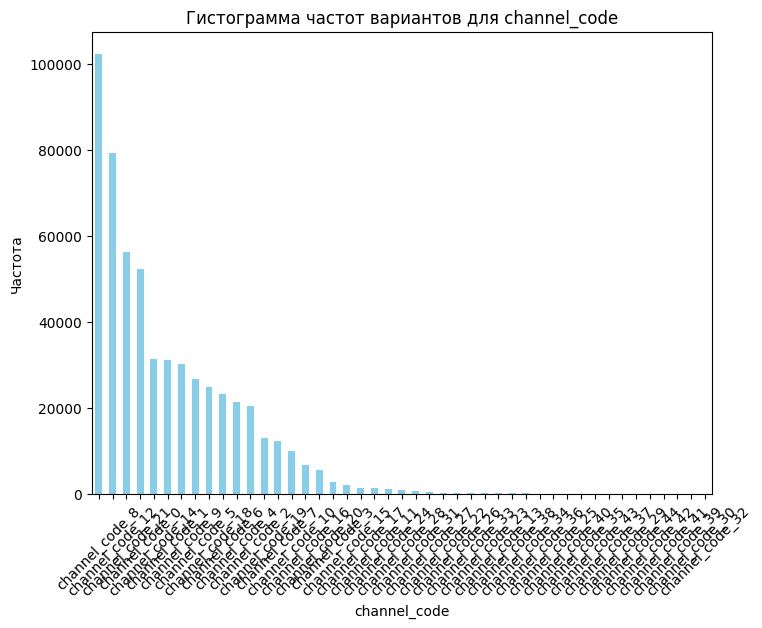

In [62]:
plot_bar(train_df, 'channel_code')

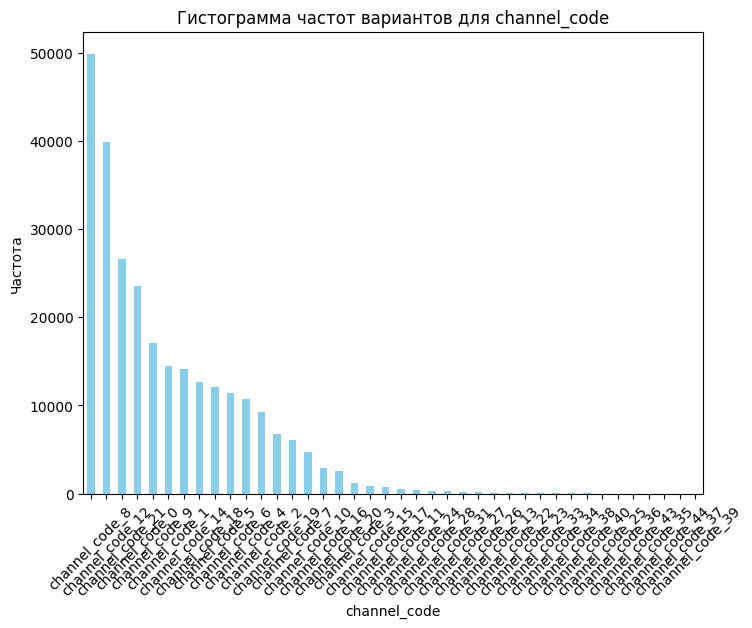

In [63]:
plot_bar(test_df, 'channel_code')

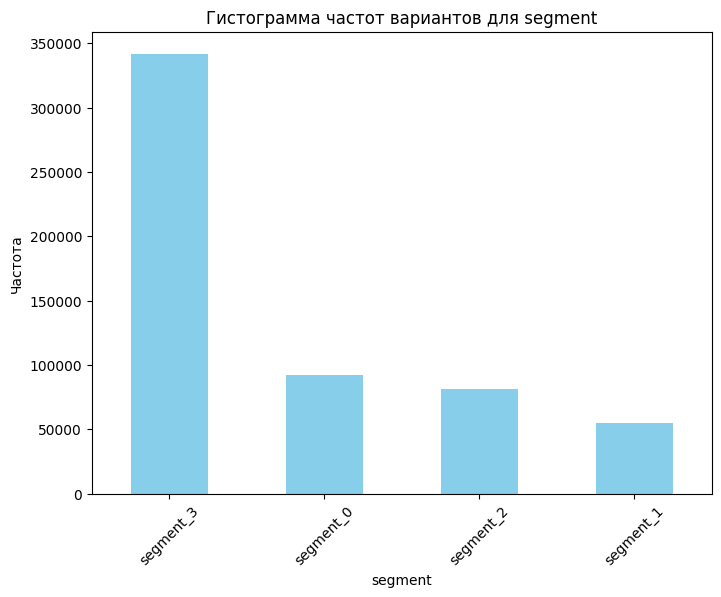

In [66]:
plot_bar(train_df, 'segment')

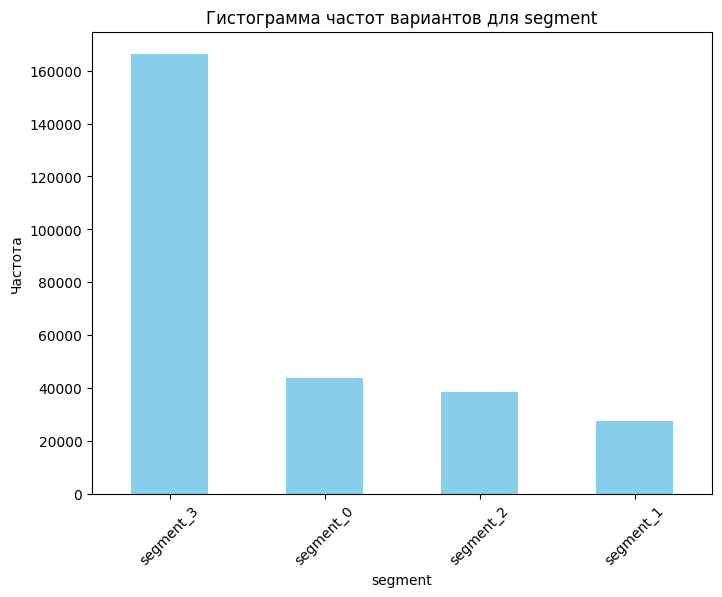

In [67]:
plot_bar(test_df, 'segment')

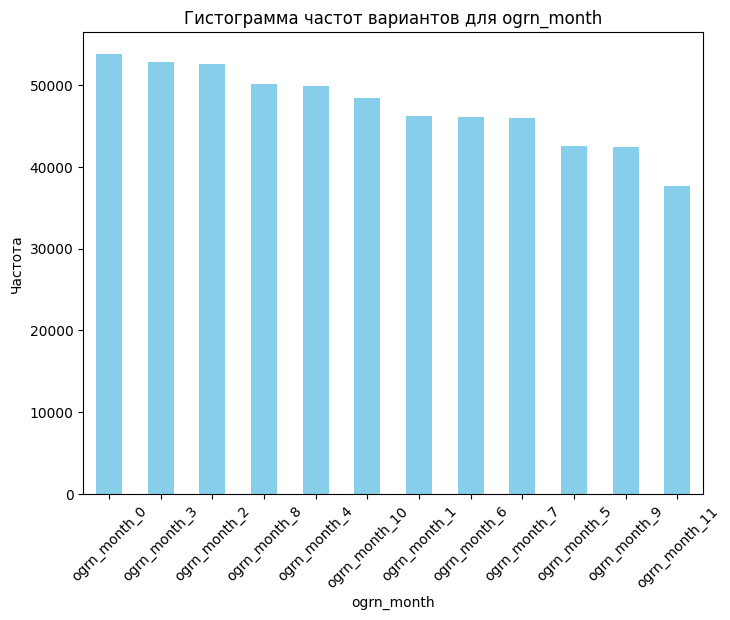

In [68]:
plot_bar(train_df, 'ogrn_month')

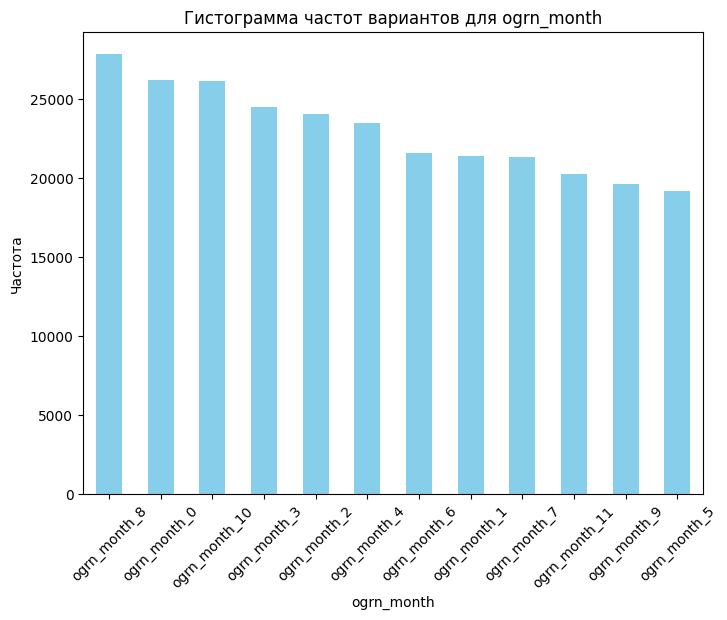

In [69]:
plot_bar(test_df, 'ogrn_month')

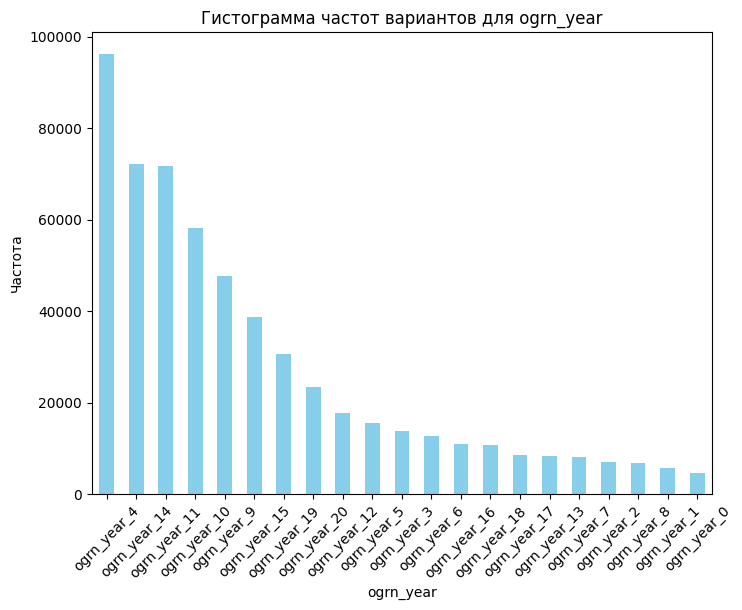

In [70]:
plot_bar(train_df, 'ogrn_year')

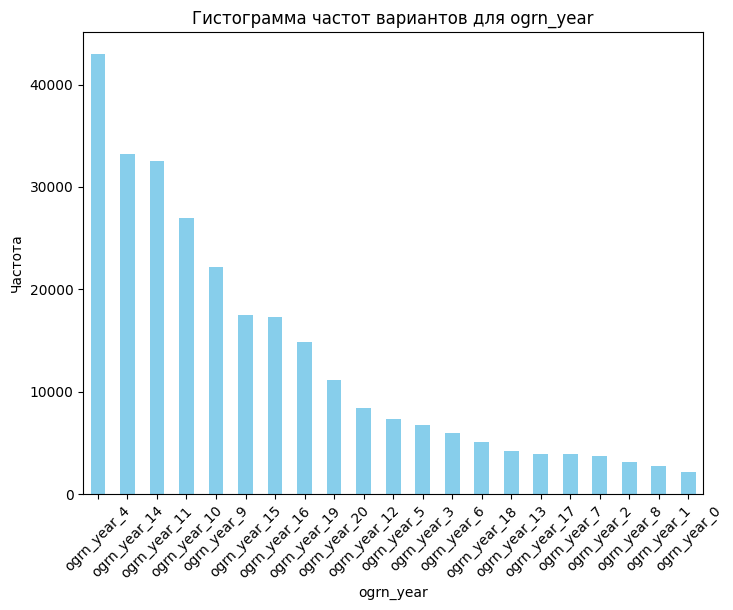

In [71]:
plot_bar(test_df, 'ogrn_year')

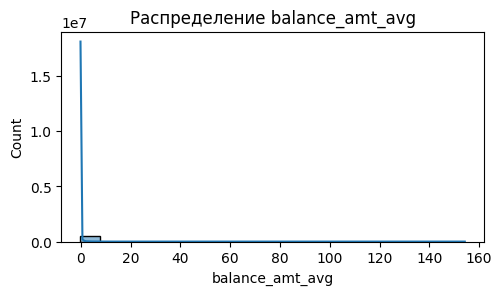

In [72]:
def my_subplot(clumn):
    plt.figure(figsize=(12, 6))  # Размер графика
    plt.subplot(2, 2, 1)  # Создаем первый subplot
    sns.histplot(clumn, bins=20, kde=True)  # Гистограмма и плотность распределения
    plt.title(f'Распределение {clumn.name}')
    
my_subplot(train_df['balance_amt_avg'])

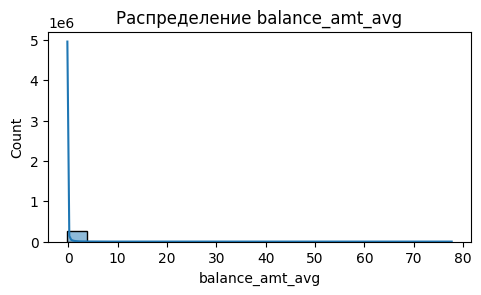

In [73]:
my_subplot(test_df['balance_amt_avg'])

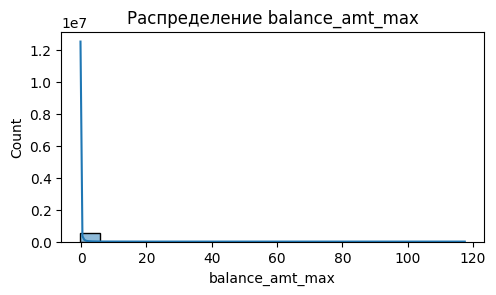

In [74]:
my_subplot(train_df['balance_amt_max'])

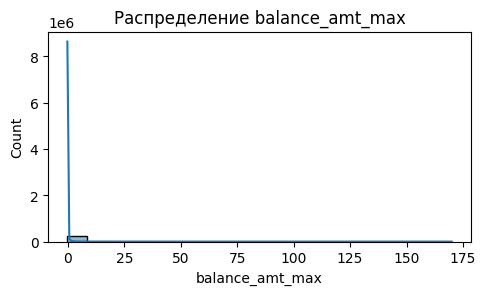

In [75]:
my_subplot(test_df['balance_amt_max'])

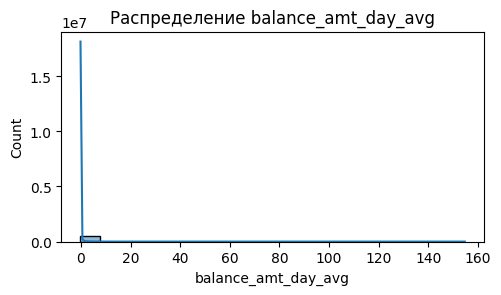

In [77]:
my_subplot(train_df['balance_amt_day_avg'])

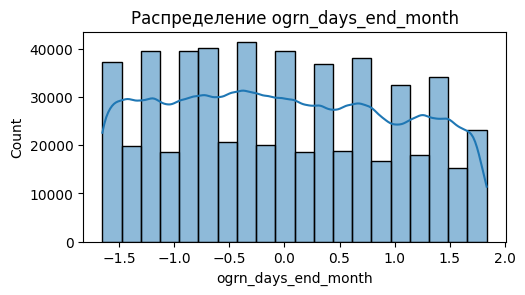

In [78]:
my_subplot(train_df['ogrn_days_end_month'])

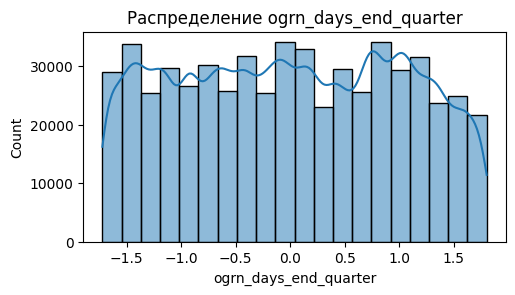

In [79]:
my_subplot(train_df['ogrn_days_end_quarter'])

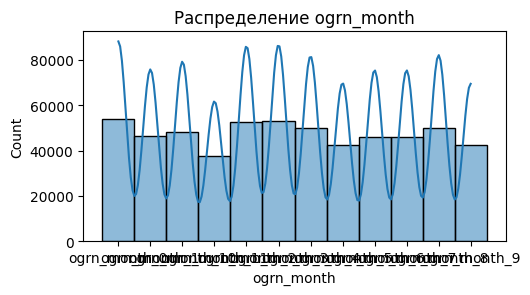

In [80]:
my_subplot(train_df['ogrn_month'])

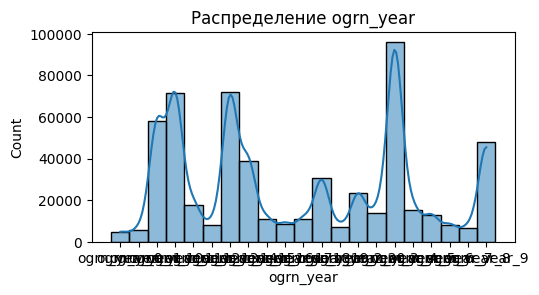

In [81]:
my_subplot(train_df['ogrn_year'])

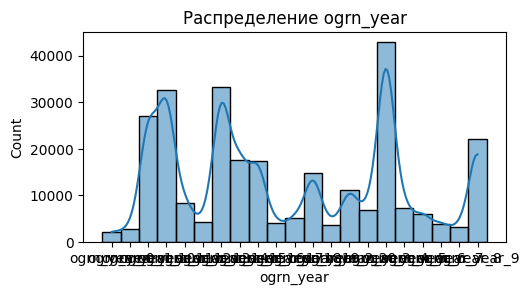

In [82]:
my_subplot(test_df['ogrn_year'])

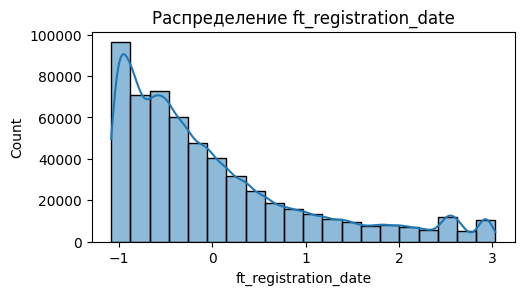

In [83]:
my_subplot(train_df['ft_registration_date']) # Количество дней с даты регистрации в ФНС

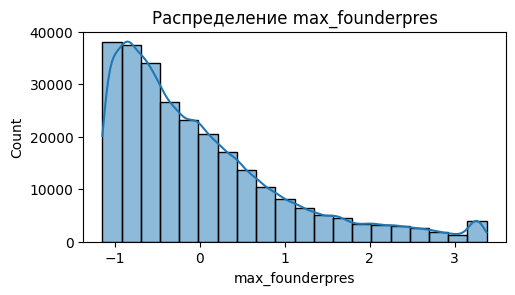

In [84]:
my_subplot(train_df['max_founderpres'])

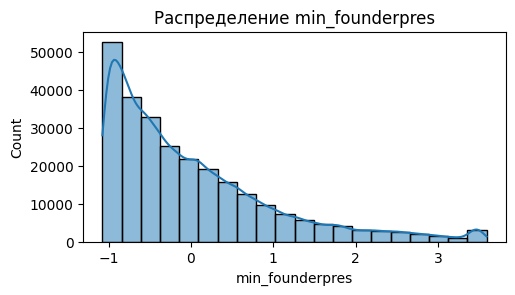

In [85]:
my_subplot(train_df['min_founderpres'])

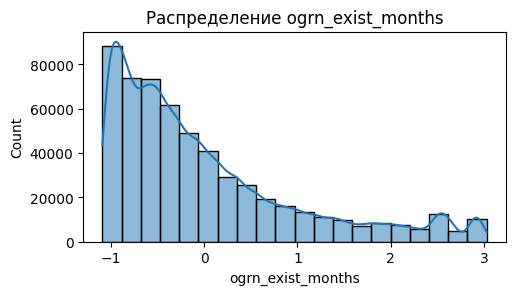

In [86]:
my_subplot(train_df['ogrn_exist_months'])

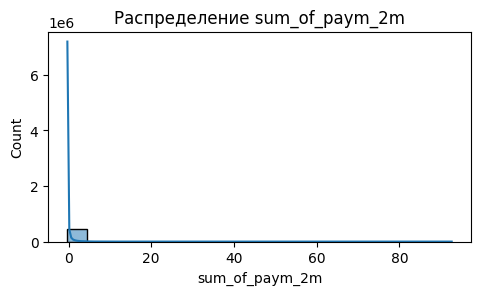

In [87]:
my_subplot(train_df['sum_of_paym_2m'])

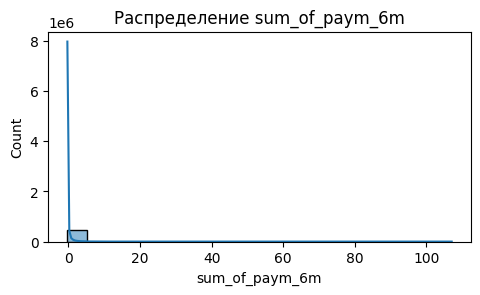

In [88]:
my_subplot(train_df['sum_of_paym_6m'])

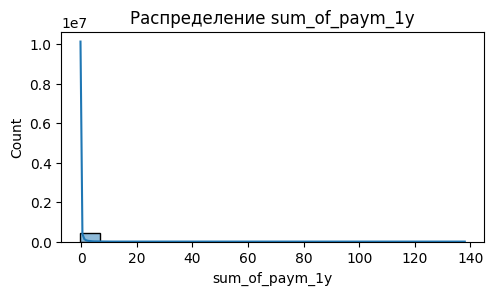

In [89]:
my_subplot(train_df['sum_of_paym_1y'])

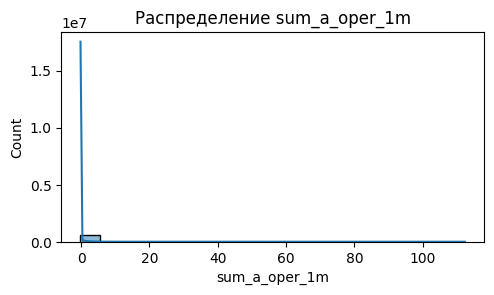

In [90]:
my_subplot(train_df['sum_a_oper_1m'])

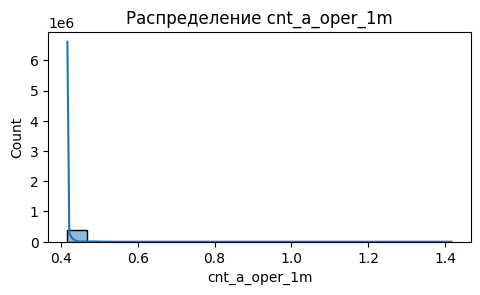

In [91]:
my_subplot(train_df['cnt_a_oper_1m'])

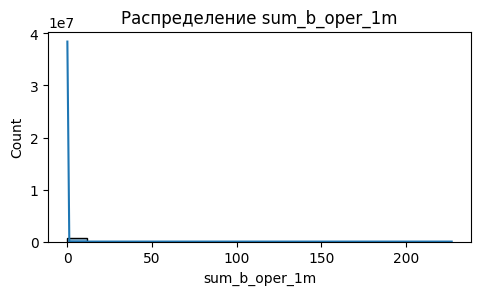

In [92]:
my_subplot(train_df['sum_b_oper_1m'])

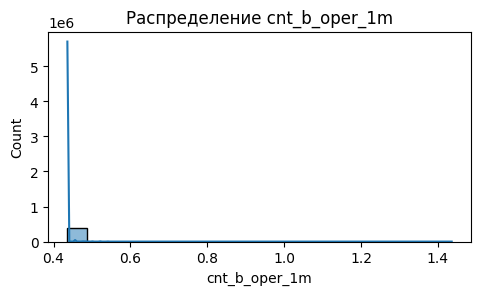

In [93]:
my_subplot(train_df['cnt_b_oper_1m'])

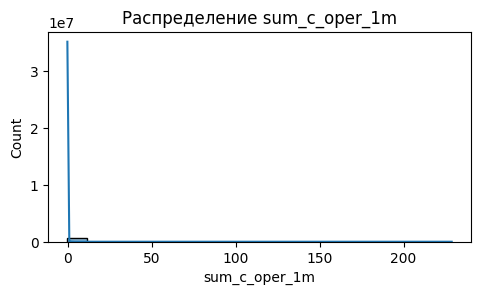

In [94]:
my_subplot(train_df['sum_c_oper_1m'])

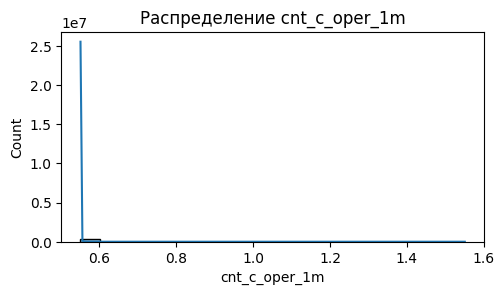

In [95]:
my_subplot(train_df['cnt_c_oper_1m'])

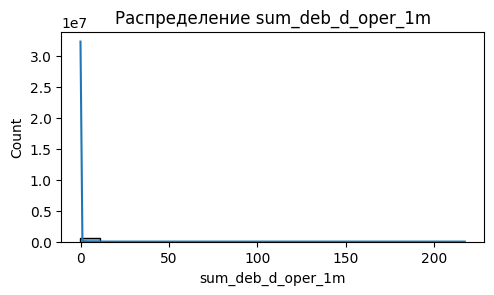

In [96]:
my_subplot(train_df['sum_deb_d_oper_1m'])

C:\Users\Artiom\AppData\Local\Temp\ipykernel_19280\3385122130.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 6))  # Размер графика


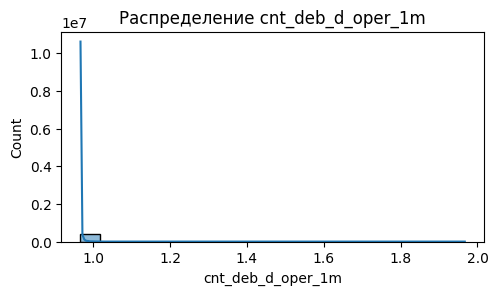

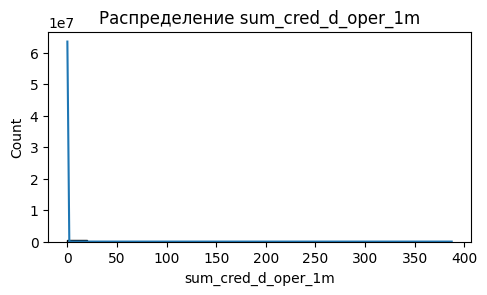

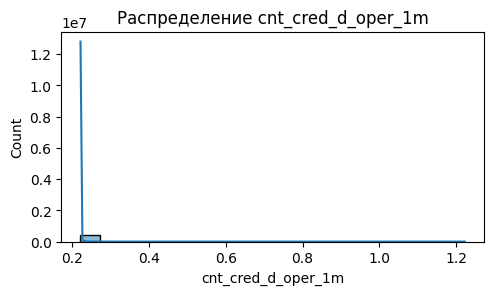

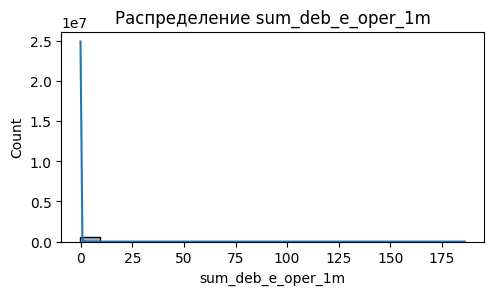

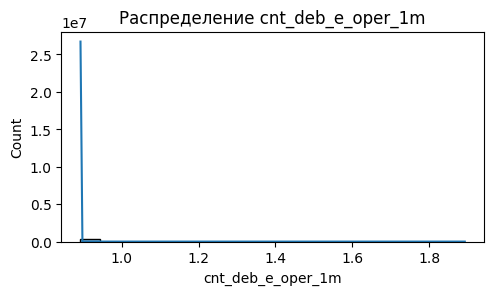

...

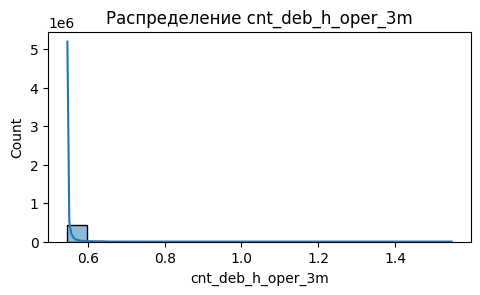

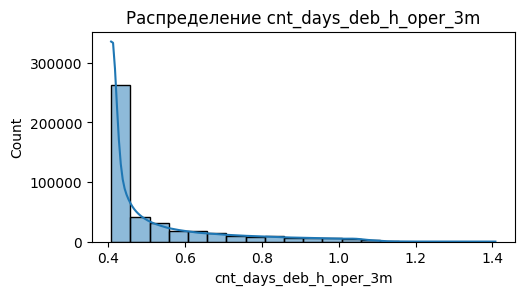

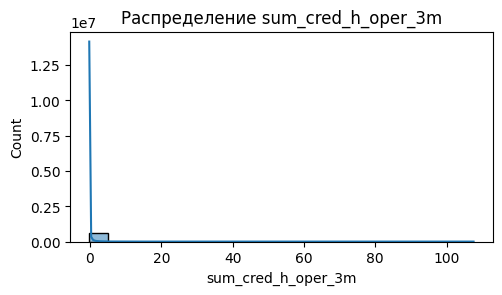

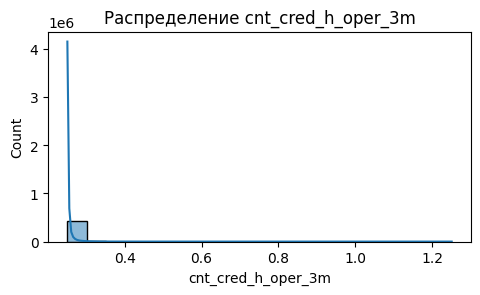

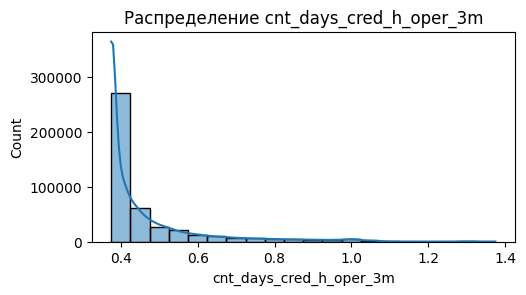

In [97]:
for col in ['cnt_deb_d_oper_1m',
'sum_cred_d_oper_1m',
'cnt_cred_d_oper_1m',
'sum_deb_e_oper_1m',
'cnt_deb_e_oper_1m',
'cnt_days_deb_e_oper_1m',
'sum_cred_e_oper_1m',
'cnt_cred_e_oper_1m',
'cnt_days_cred_e_oper_1m',
'sum_deb_f_oper_1m',
'cnt_deb_f_oper_1m',
'cnt_days_deb_f_oper_1m',
'sum_cred_f_oper_1m',
'cnt_cred_f_oper_1m',
'cnt_days_cred_f_oper_1m',
'sum_deb_g_oper_1m',
'cnt_deb_g_oper_1m',
'cnt_days_deb_g_oper_1m',
'sum_cred_g_oper_1m',
'cnt_cred_g_oper_1m',
'cnt_days_cred_g_oper_1m',
'sum_deb_h_oper_1m',
'cnt_deb_h_oper_1m',
'cnt_days_deb_h_oper_1m',
'sum_cred_h_oper_1m',
'cnt_cred_h_oper_1m',
'cnt_days_cred_h_oper_1m',
'sum_a_oper_3m',
'cnt_a_oper_3m',
'sum_b_oper_3m',
'cnt_b_oper_3m',
'sum_c_oper_3m',
'cnt_c_oper_3m',
'sum_deb_d_oper_3m',
'cnt_deb_d_oper_3m',
'sum_cred_d_oper_3m',
'cnt_cred_d_oper_3m',
'sum_deb_e_oper_3m',
'cnt_deb_e_oper_3m',
'cnt_days_deb_e_oper_3m',
'sum_cred_e_oper_3m',
'cnt_cred_e_oper_3m',
'cnt_days_cred_e_oper_3m',
'sum_deb_f_oper_3m',
'cnt_deb_f_oper_3m',
'cnt_days_deb_f_oper_3m',
'sum_cred_f_oper_3m',
'cnt_cred_f_oper_3m',
'cnt_days_cred_f_oper_3m',
'sum_deb_g_oper_3m',
'cnt_deb_g_oper_3m',
'cnt_days_deb_g_oper_3m',
'sum_cred_g_oper_3m',
'cnt_cred_g_oper_3m',
'cnt_days_cred_g_oper_3m',
'sum_deb_h_oper_3m',
'cnt_deb_h_oper_3m',
'cnt_days_deb_h_oper_3m',
'sum_cred_h_oper_3m',
'cnt_cred_h_oper_3m',
'cnt_days_cred_h_oper_3m']:
    my_subplot(train_df[col])

### scatterplot

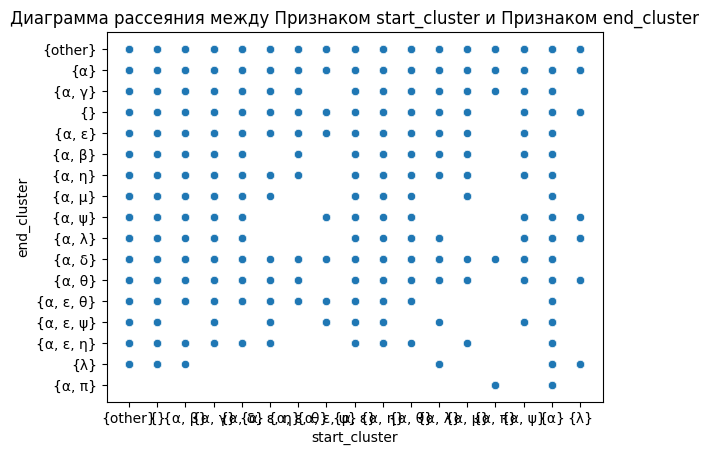

In [99]:
def scatterplot(df, x, y):
    # Построение диаграммы рассеяния для пары признаков
    sns.scatterplot(data=df, x=x, y=y)
    plt.title(f'Диаграмма рассеяния между Признаком {x} и Признаком {y}')
    plt.show()

scatterplot(train_df, 'start_cluster', 'end_cluster')

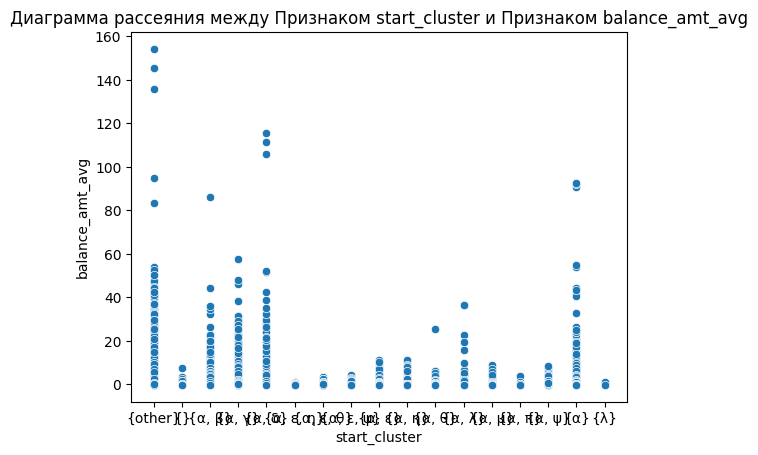

In [100]:
scatterplot(train_df, 'start_cluster', 'balance_amt_avg')

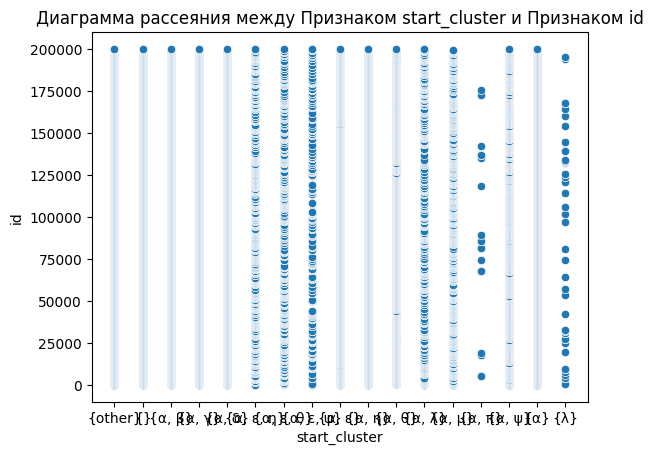

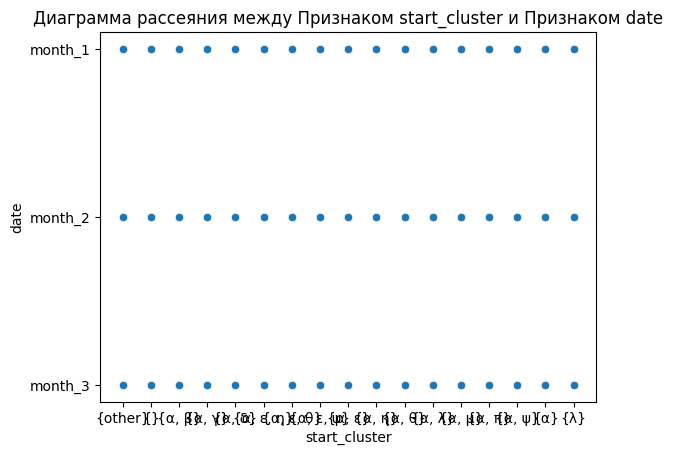

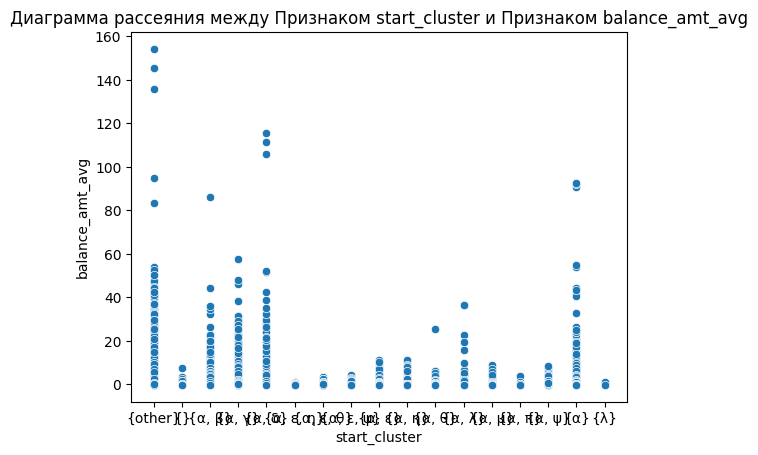

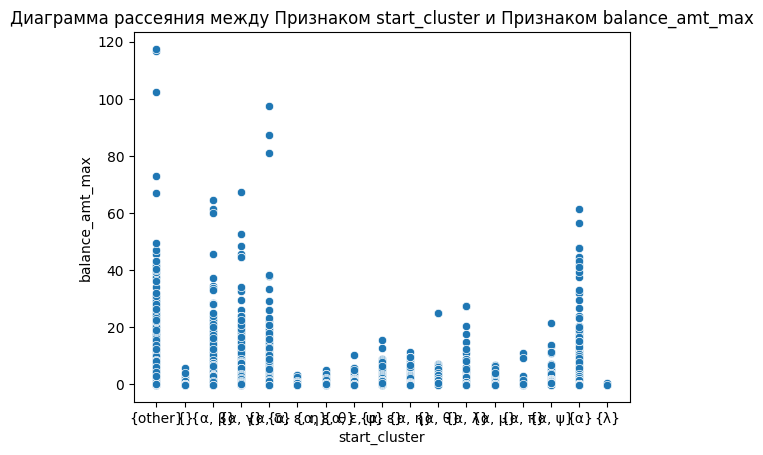

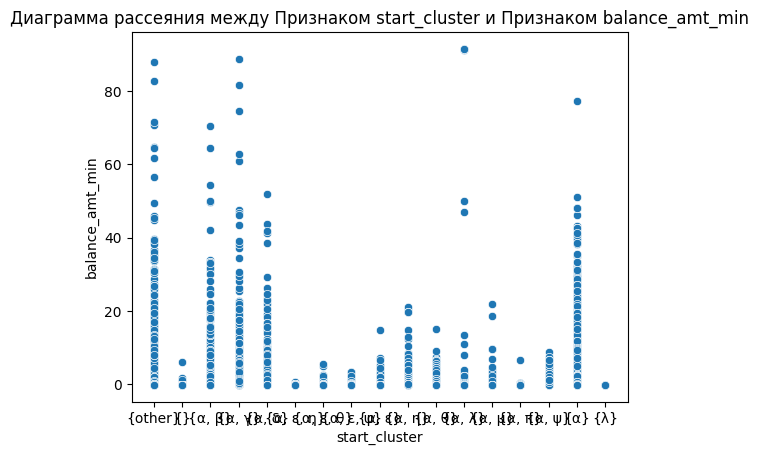

...

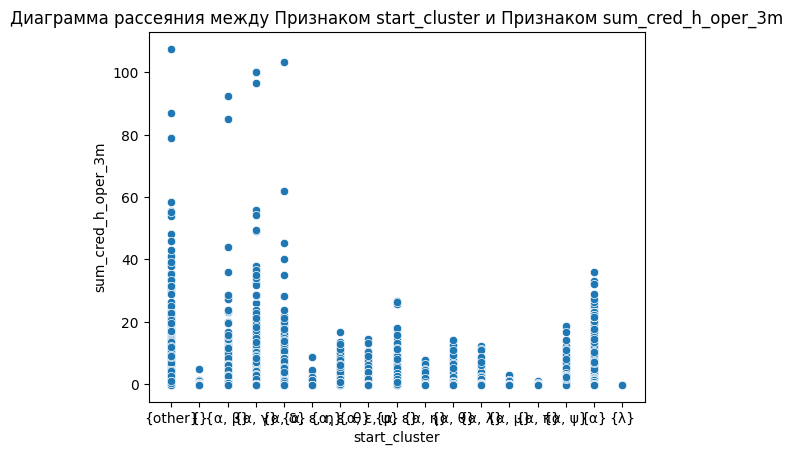

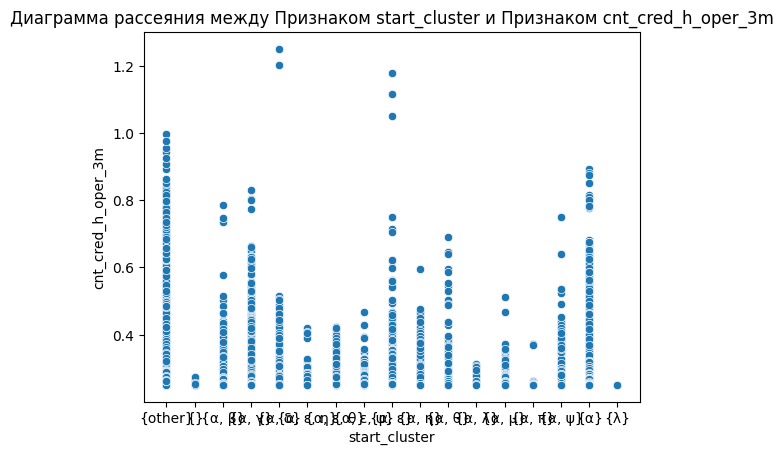

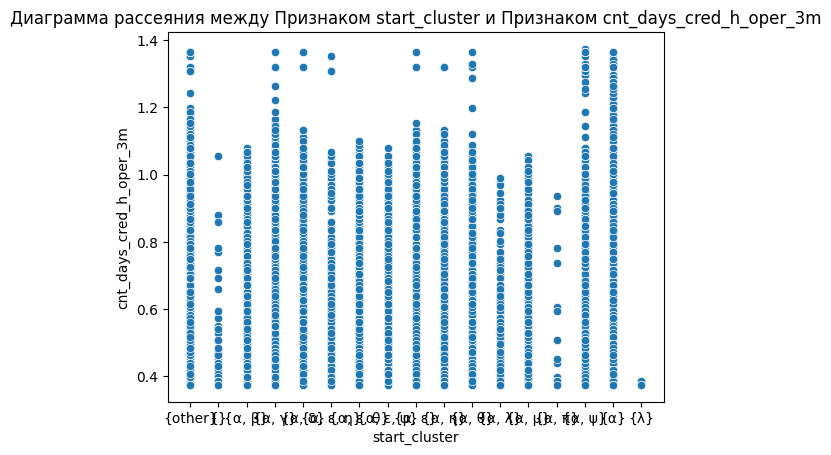

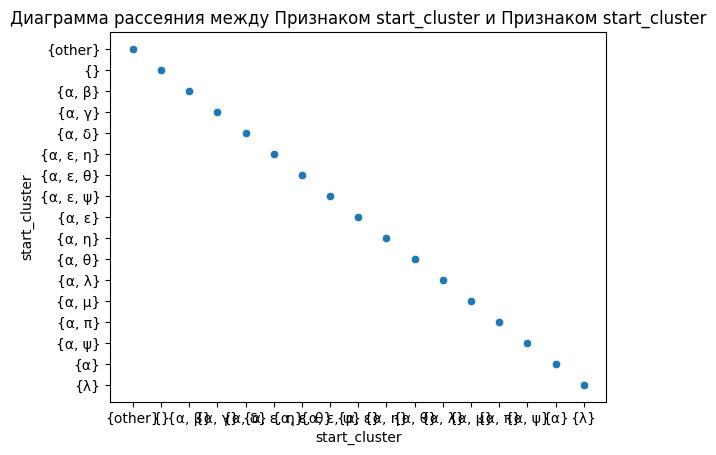

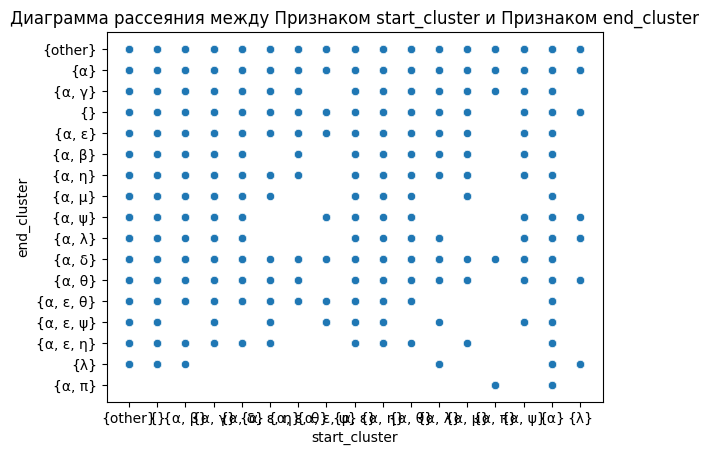

In [102]:
for col in train_df.columns:
    scatterplot(train_df, 'start_cluster', col)

### lineplot

In [108]:
for col in train_df.columns:
    sns.lineplot(
            x='date', 
            y=col,
            data=train_df.iloc[:10])

Error in callback <function _draw_all_if_interactive at 0x000002122E821A80> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000002122EDE5080> (for post_execute):


KeyboardInterrupt: 

### Box and Whisker

In [109]:
def Box_and_Whisker(df, column):
    sns.boxplot(x=column, data=df)
    plt.title(f'Диаграмма Box-and-Whisker для {column}')
    plt.tight_layout()  # Автоматически настраиваем расположение subplot'ов
    plt.show()

ft_registration_date


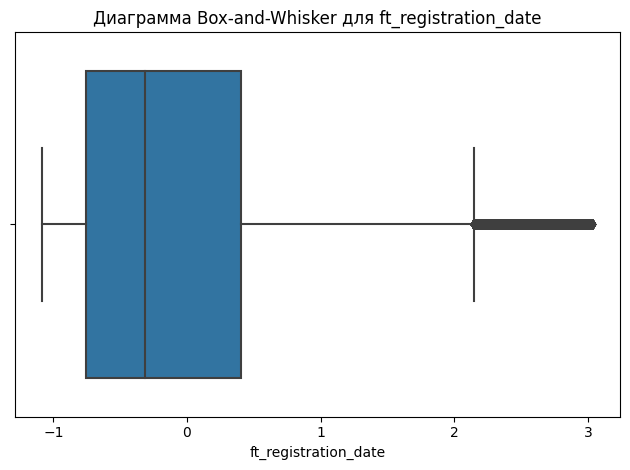

balance_amt_avg


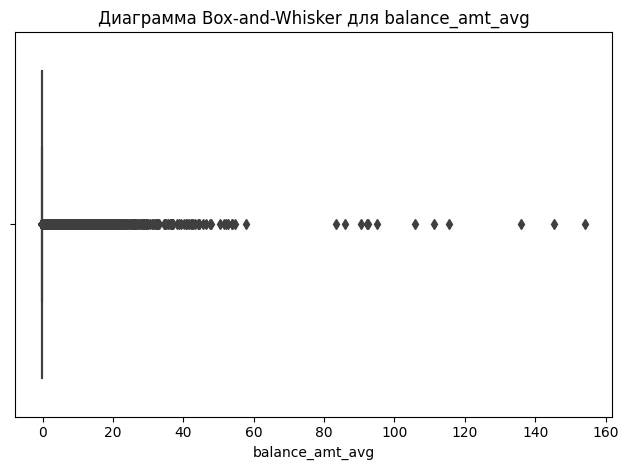

sum_cred_g_oper_1m


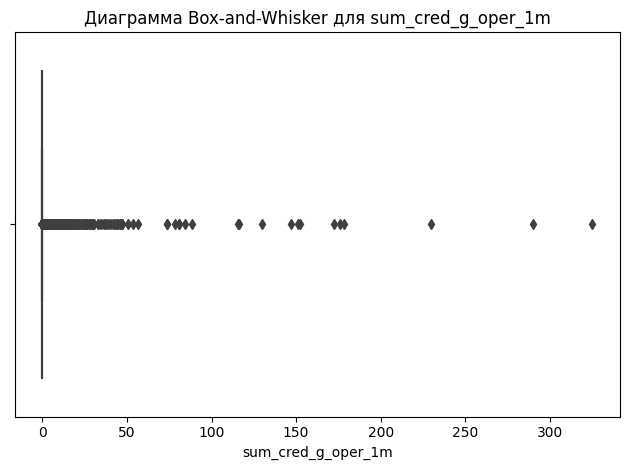

sum_cred_e_oper_3m


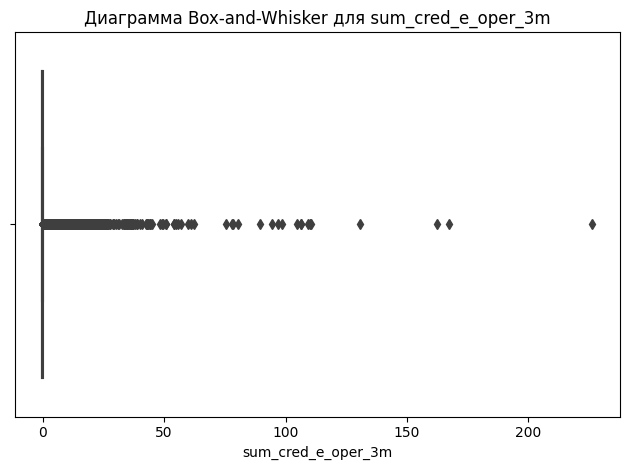

cnt_days_cred_e_oper_1m


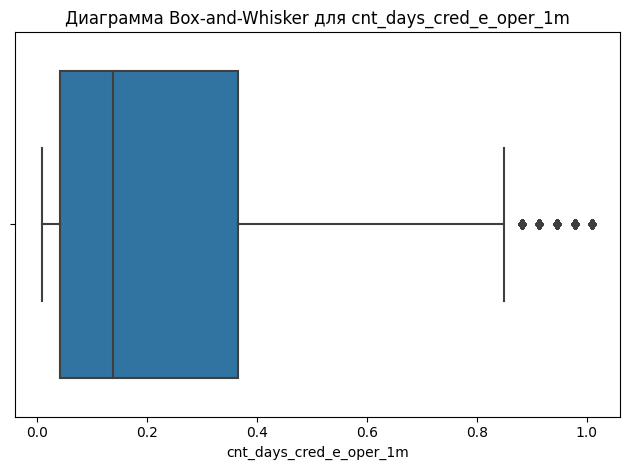

max_founderpres


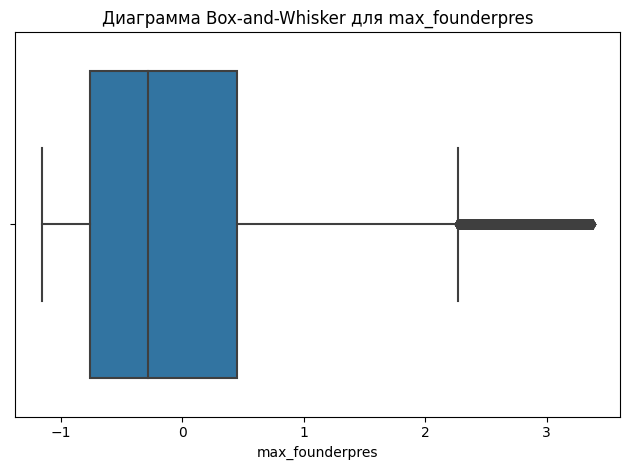

sum_cred_d_oper_1m


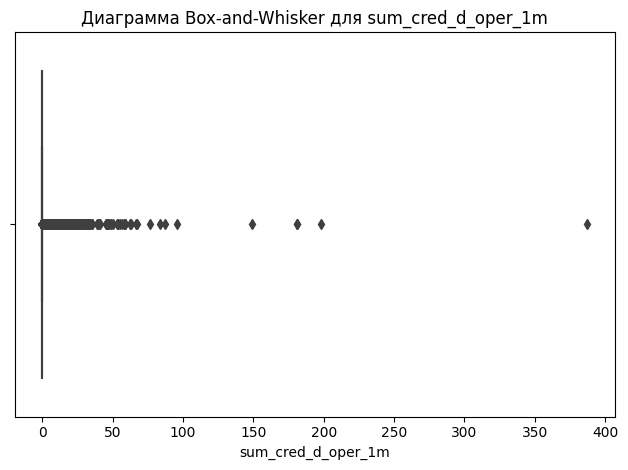

cnt_days_deb_g_oper_3m


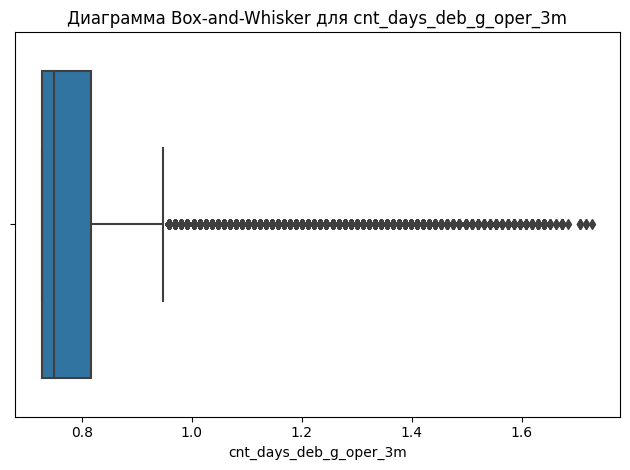

sum_of_paym_2m


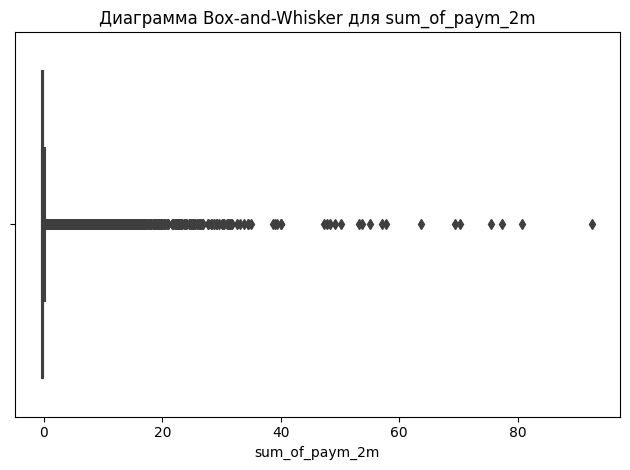

sum_cred_h_oper_3m


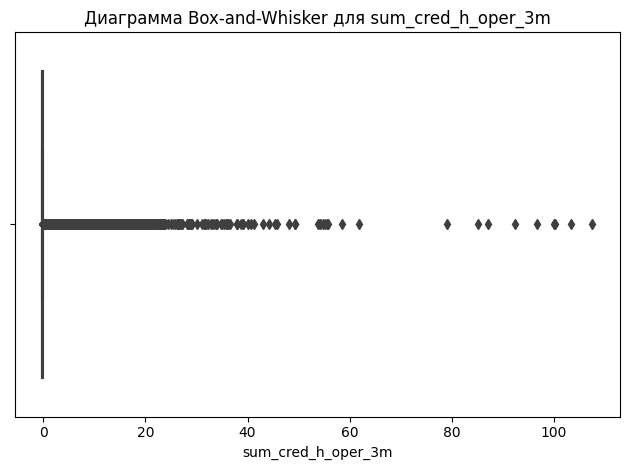

cnt_cred_g_oper_1m


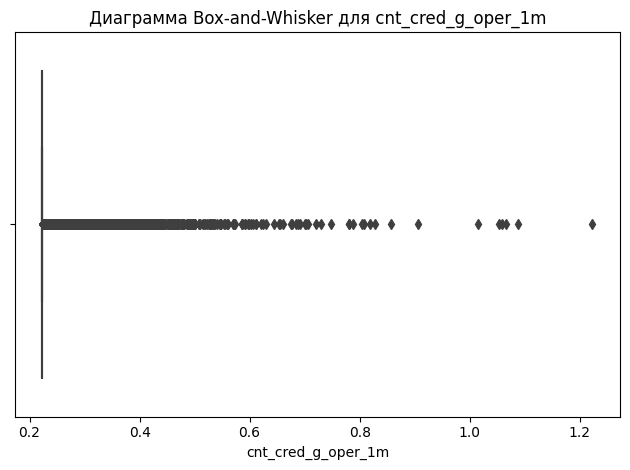

cnt_days_cred_f_oper_3m


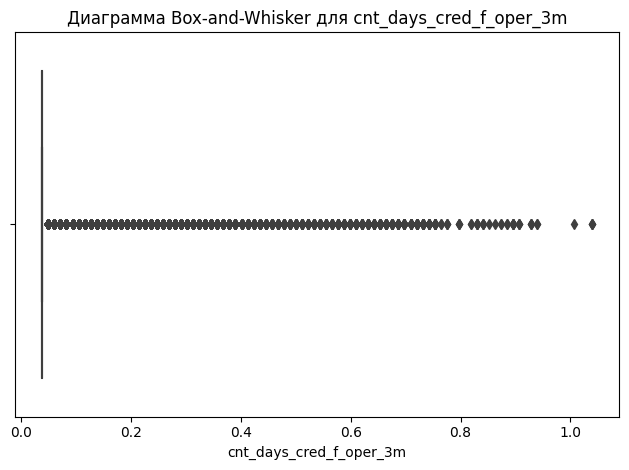

cnt_deb_h_oper_3m


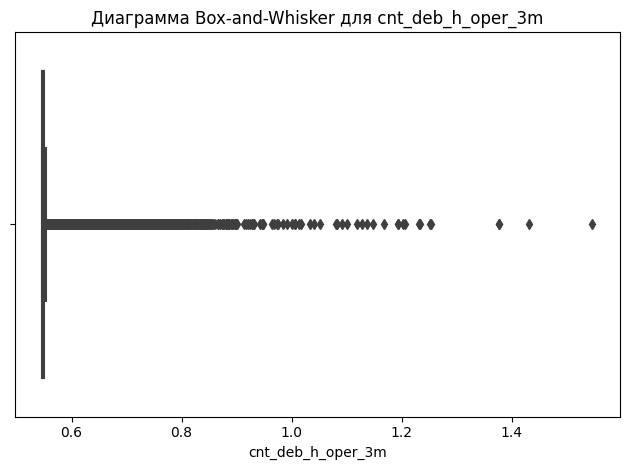

sum_of_paym_1y


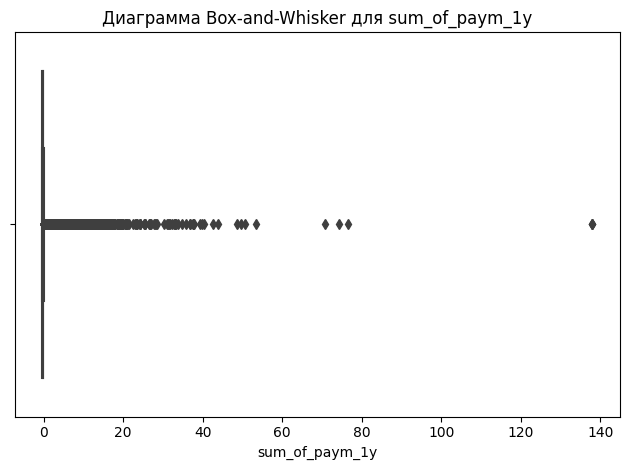

cnt_deb_f_oper_3m


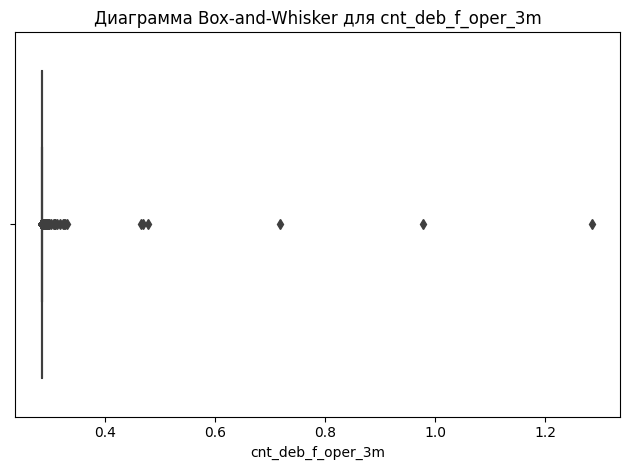

id


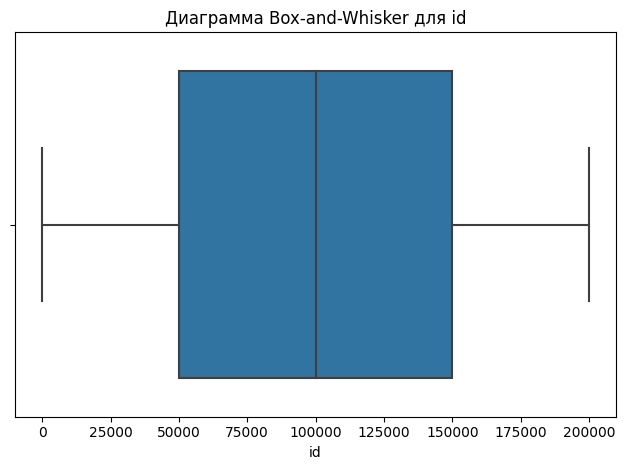

cnt_cred_e_oper_1m


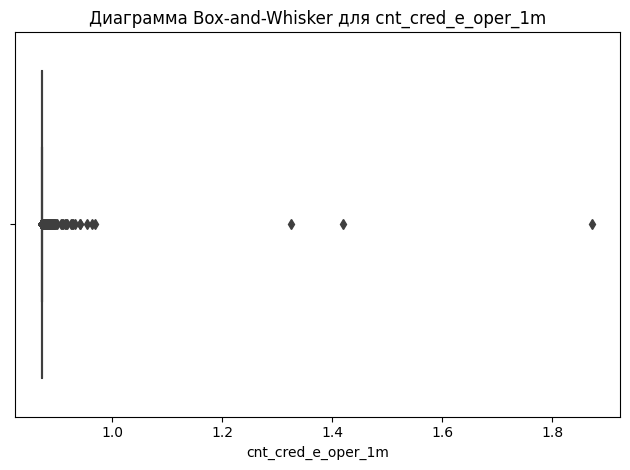

cnt_days_deb_f_oper_1m


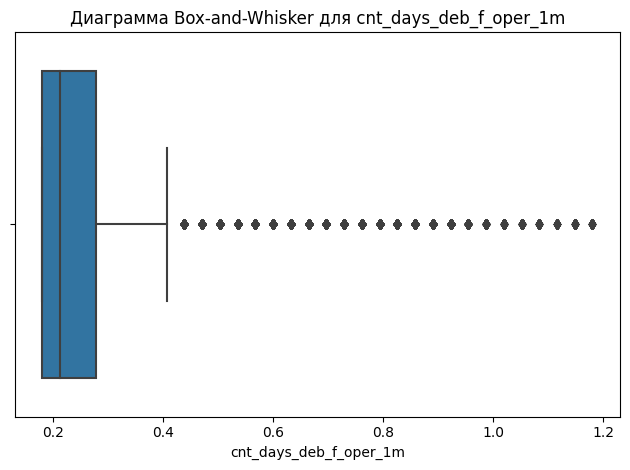

cnt_days_cred_h_oper_1m


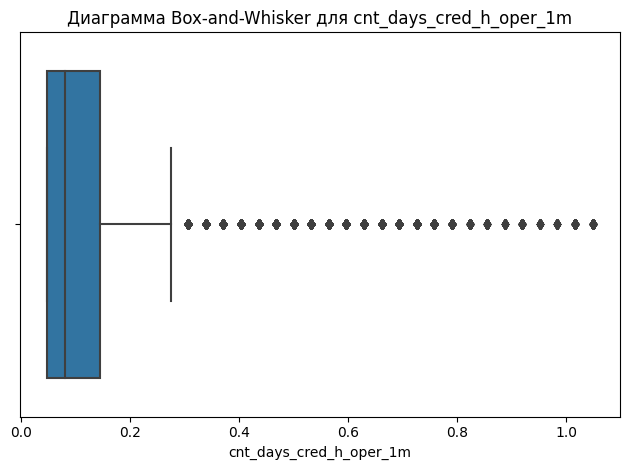

cnt_days_deb_e_oper_1m


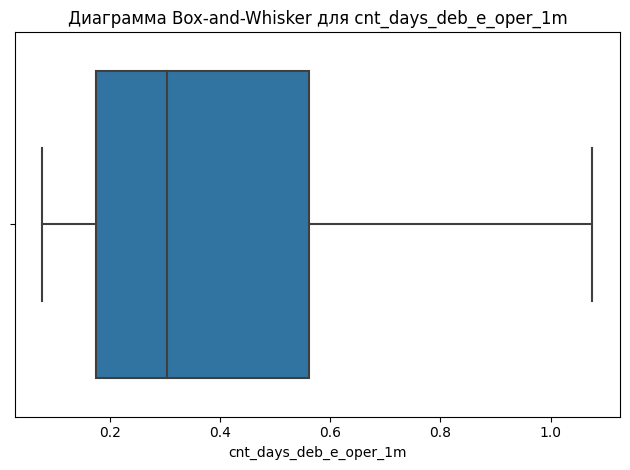

sum_of_paym_6m


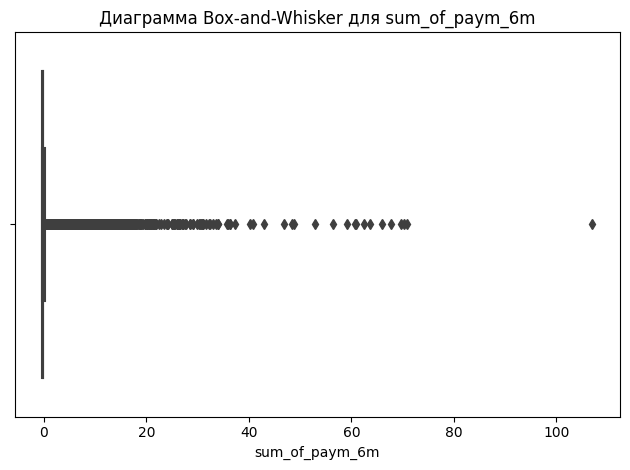

cnt_days_deb_e_oper_3m


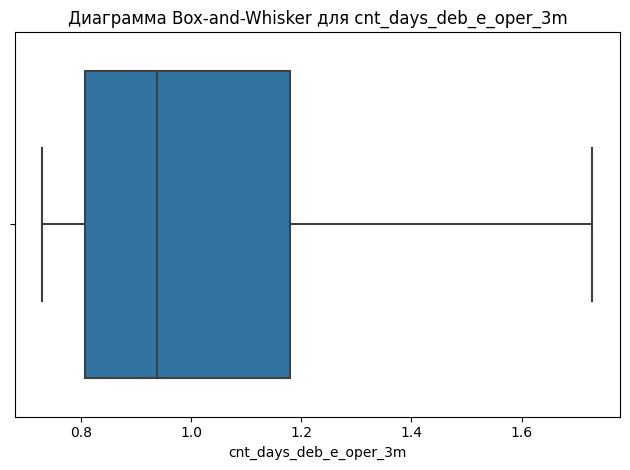

sum_cred_d_oper_3m


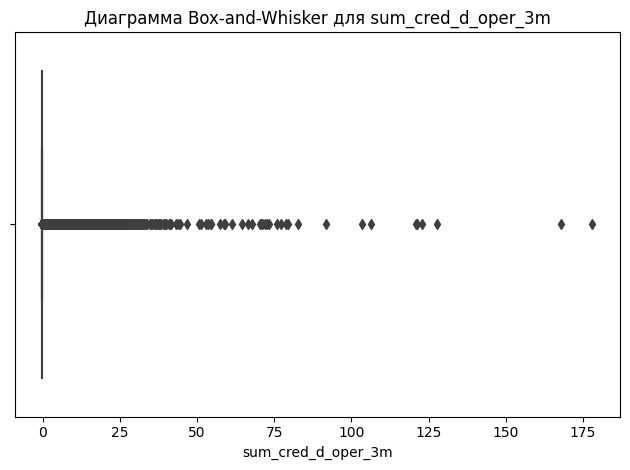

cnt_days_deb_f_oper_3m


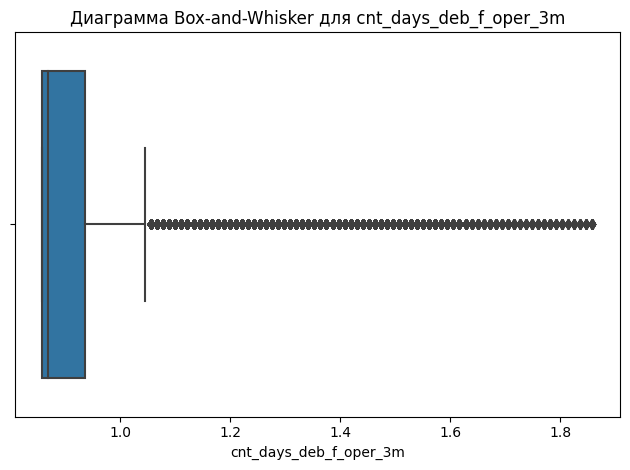

cnt_days_cred_h_oper_3m


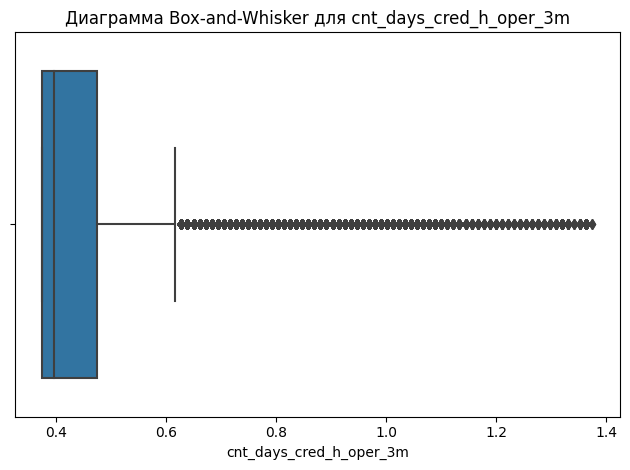

sum_c_oper_1m


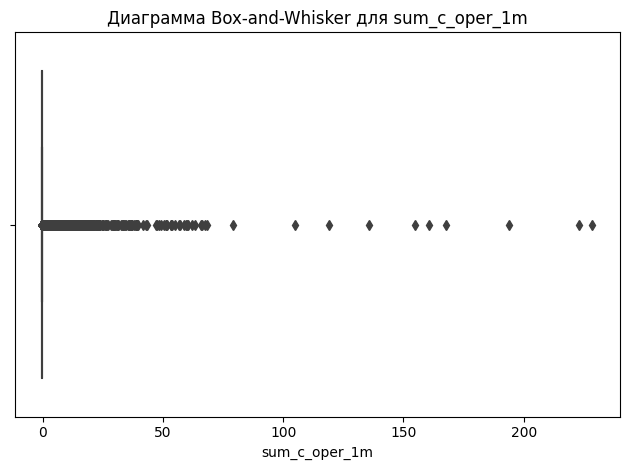

ogrn_exist_months


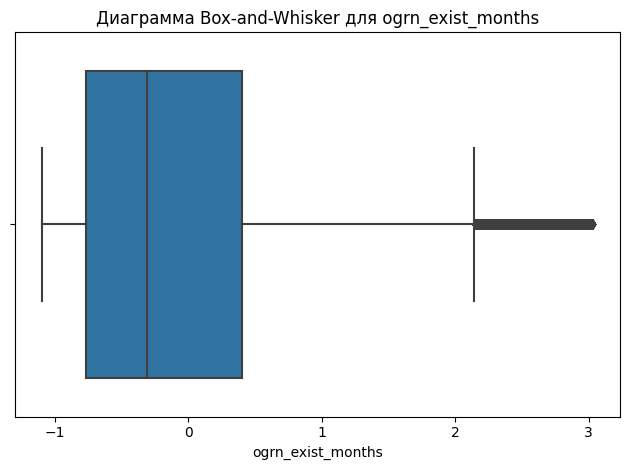

cnt_days_cred_g_oper_3m


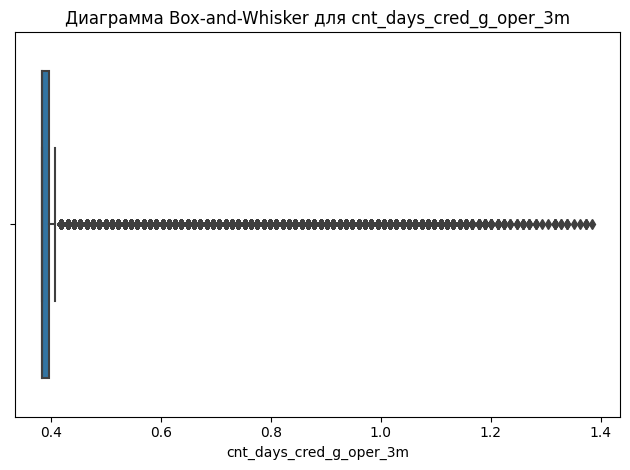

cnt_c_oper_1m


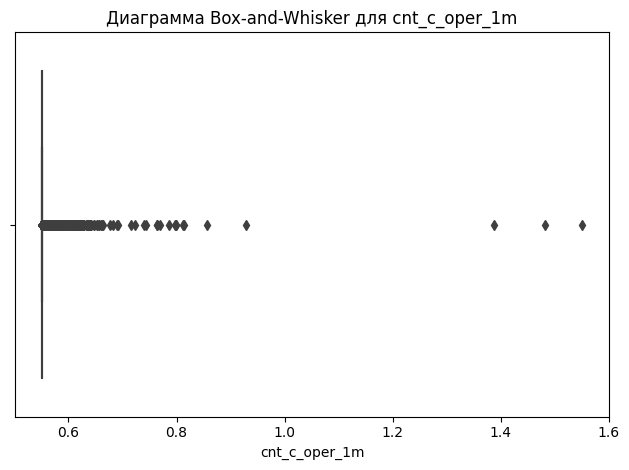

sum_deb_g_oper_1m


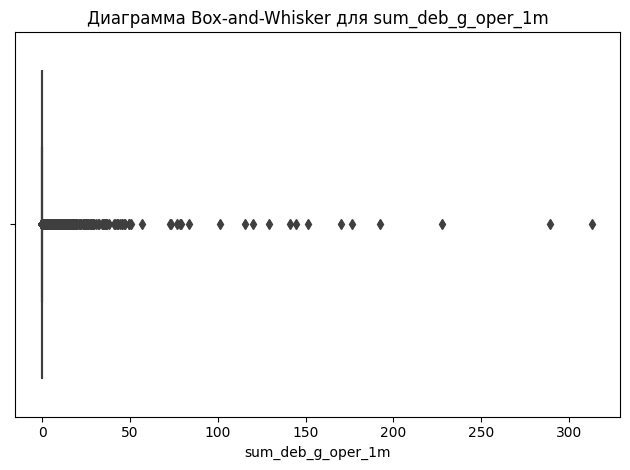

cnt_cred_d_oper_1m


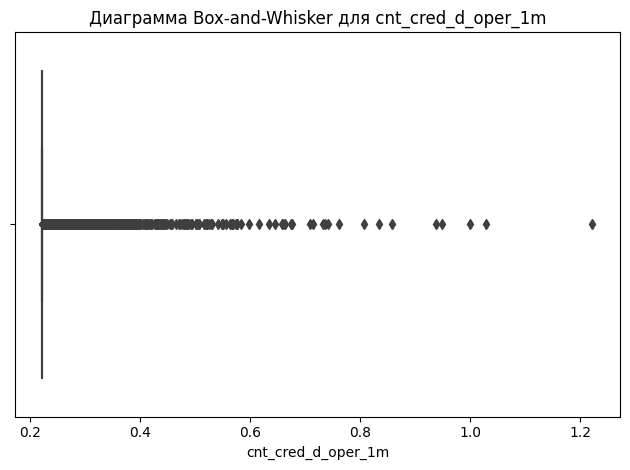

sum_b_oper_1m


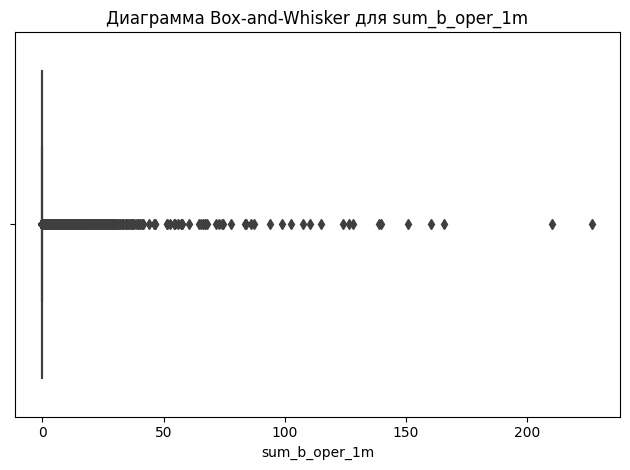

sum_a_oper_3m


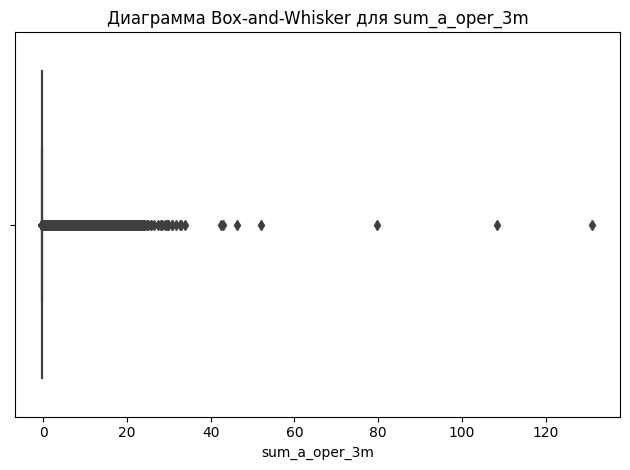

sum_b_oper_3m


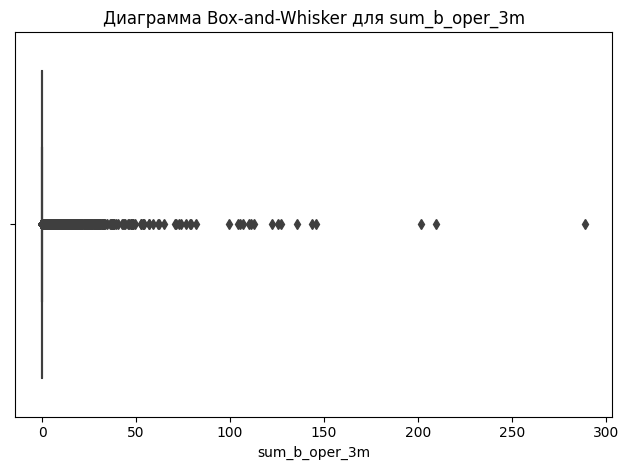

cnt_days_cred_e_oper_3m


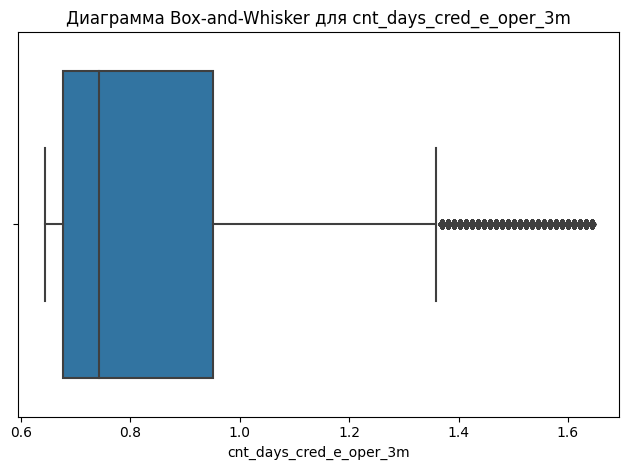

balance_amt_day_avg


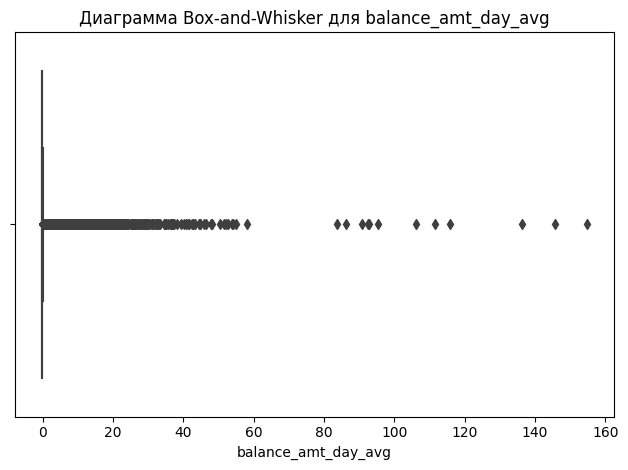

sum_cred_h_oper_1m


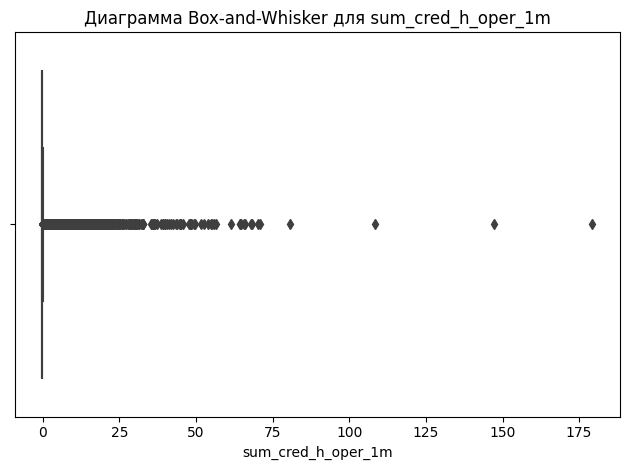

sum_deb_h_oper_3m


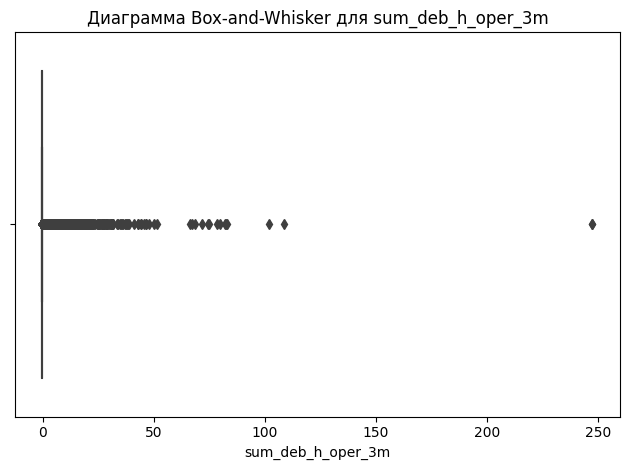

sum_cred_f_oper_1m


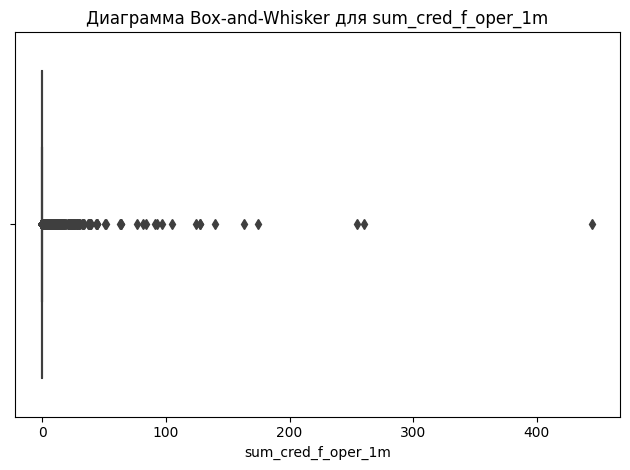

sum_deb_e_oper_3m


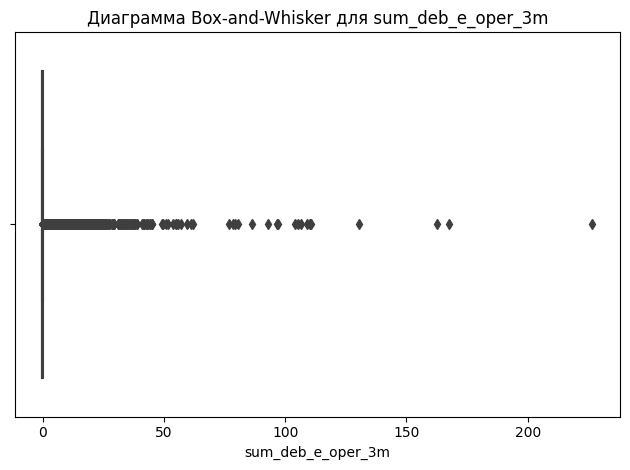

cnt_deb_d_oper_3m


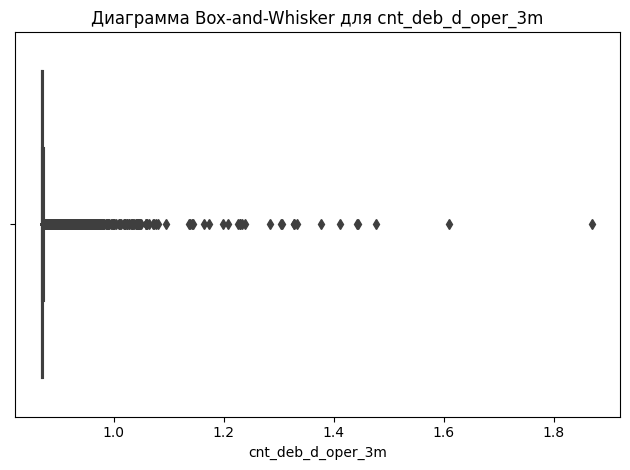

balance_amt_max


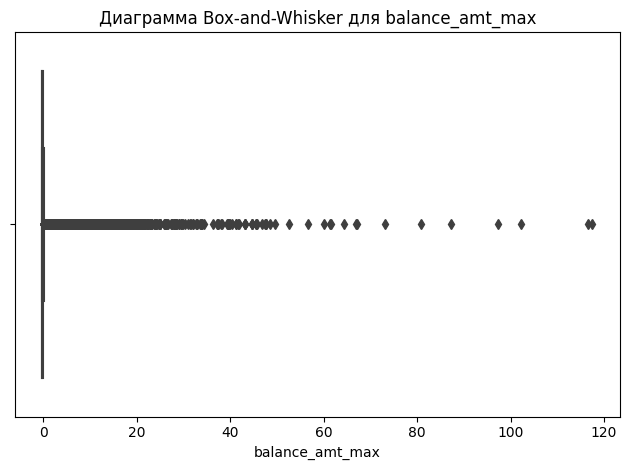

cnt_deb_e_oper_1m


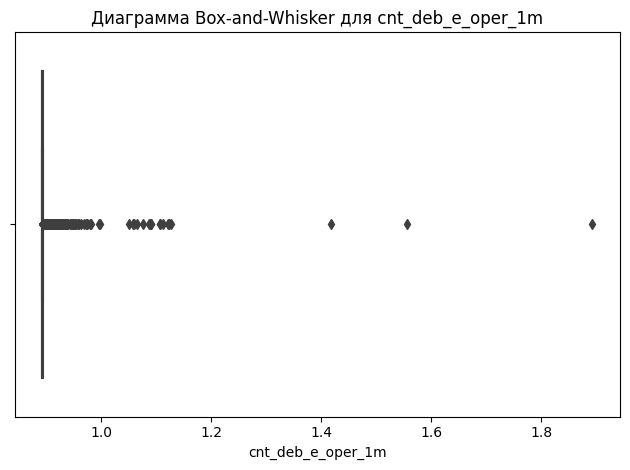

sum_cred_f_oper_3m


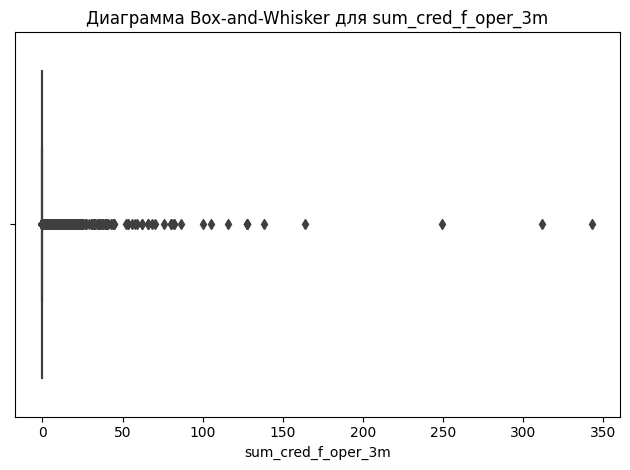

sum_a_oper_1m


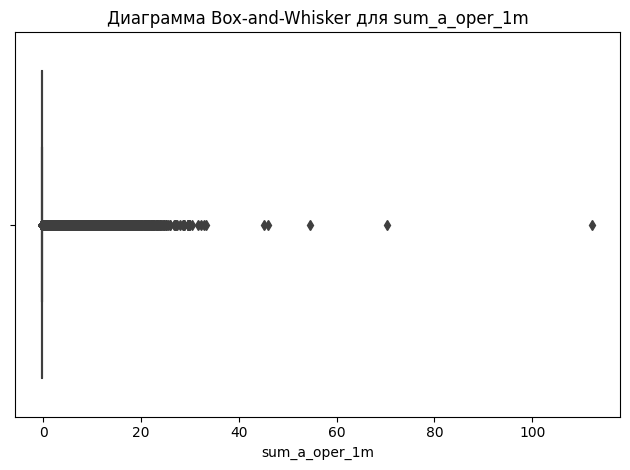

sum_cred_e_oper_1m


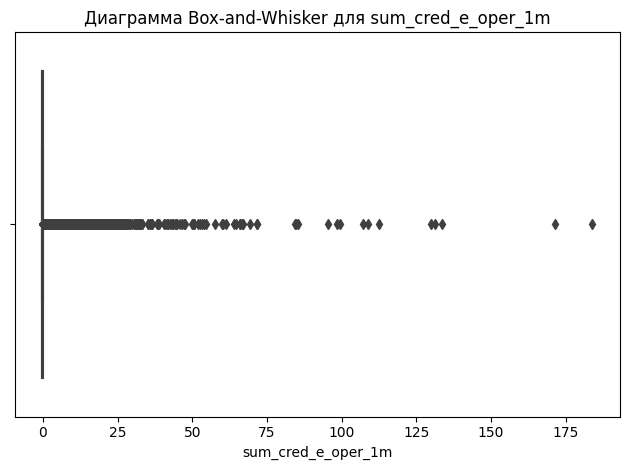

cnt_deb_f_oper_1m


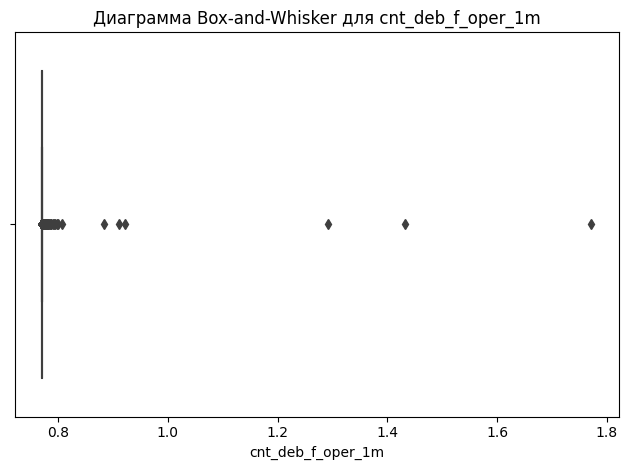

sum_deb_e_oper_1m


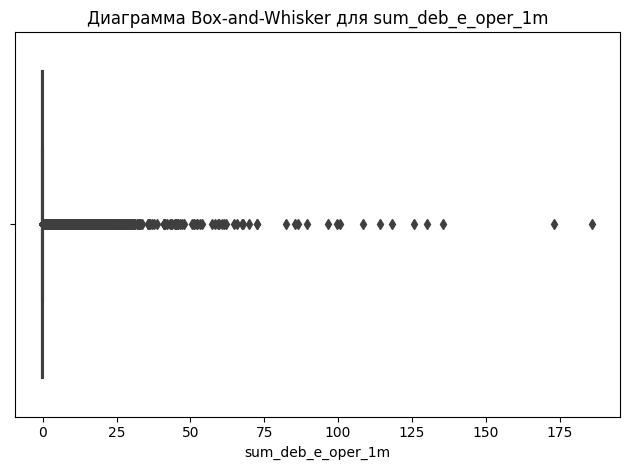

cnt_cred_g_oper_3m


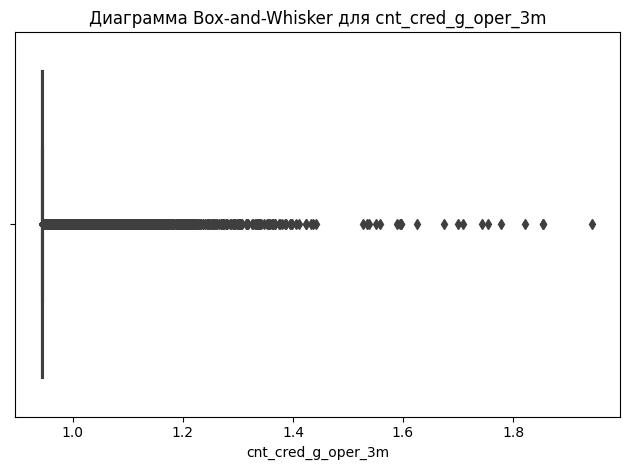

cnt_deb_g_oper_1m


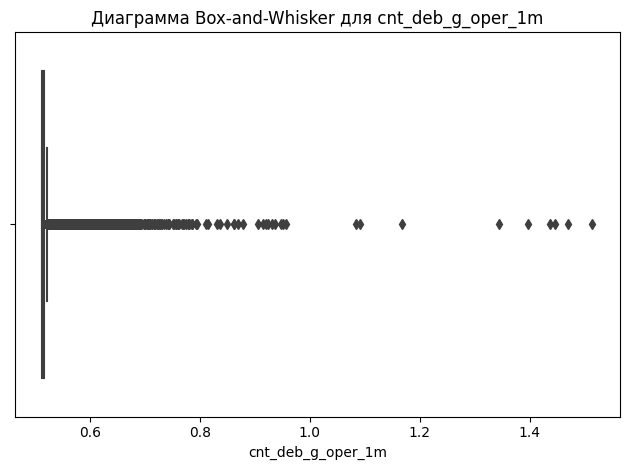

cnt_b_oper_1m


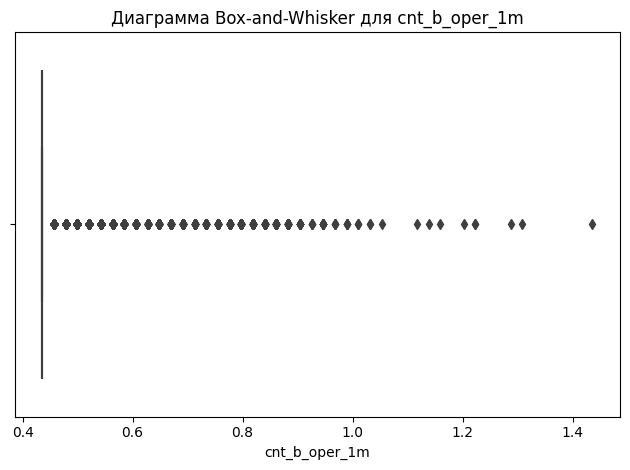

cnt_a_oper_1m


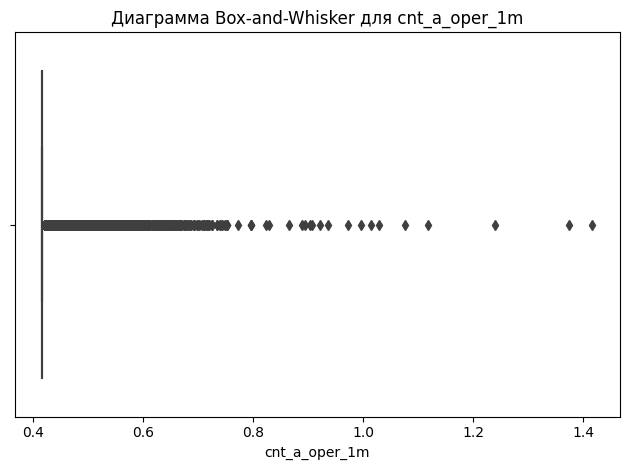

cnt_days_cred_g_oper_1m


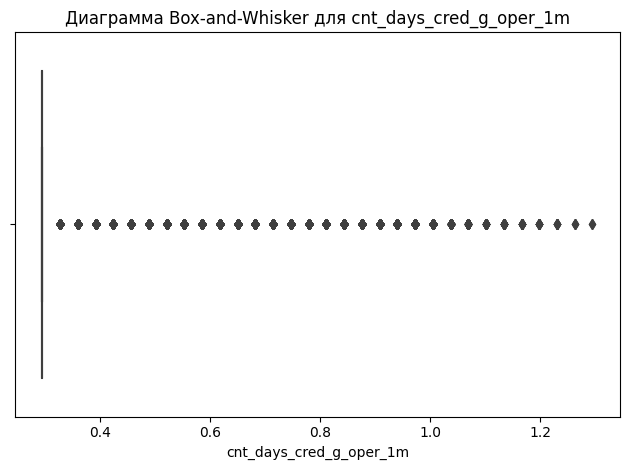

sum_deb_d_oper_3m


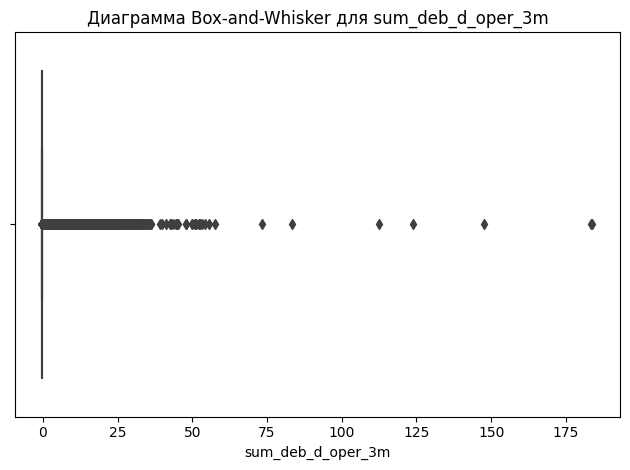

sum_deb_f_oper_1m


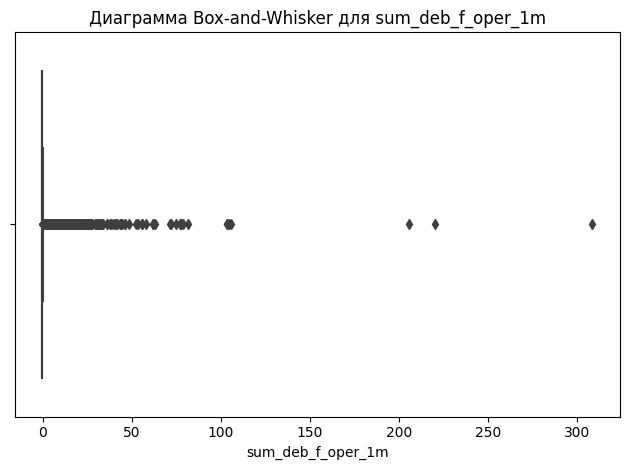

ogrn_days_end_month


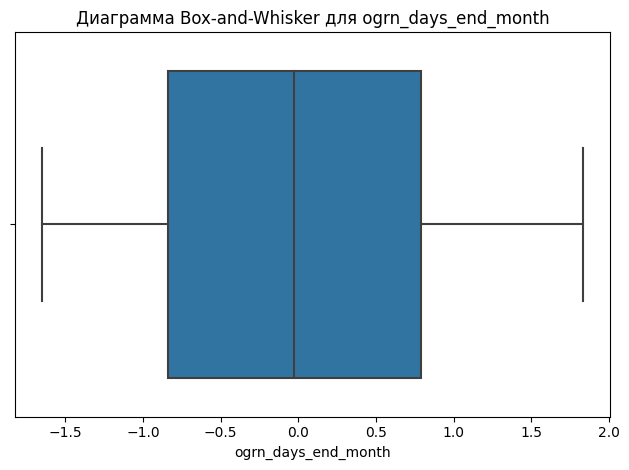

balance_amt_min


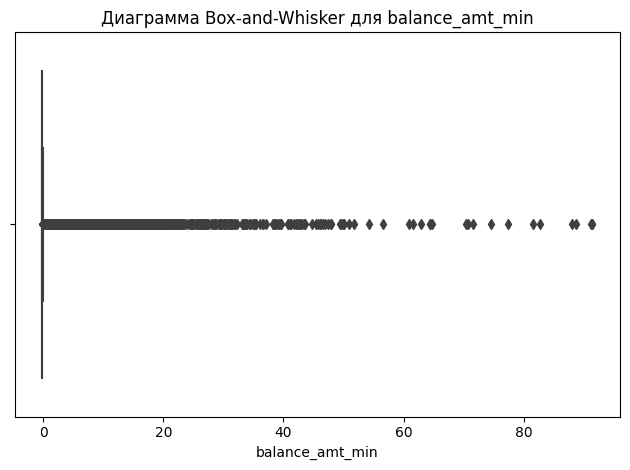

cnt_days_deb_g_oper_1m


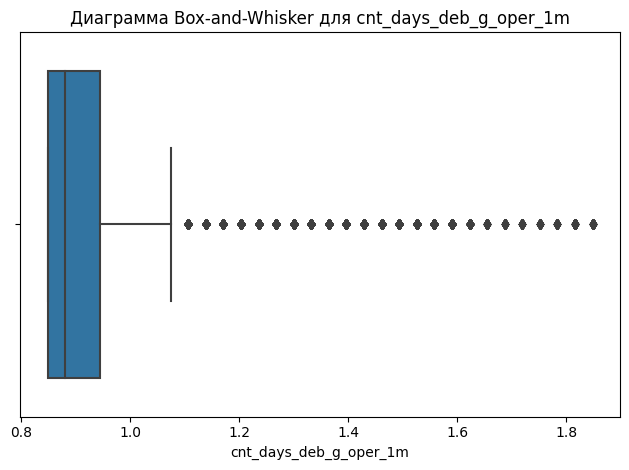

cnt_deb_h_oper_1m


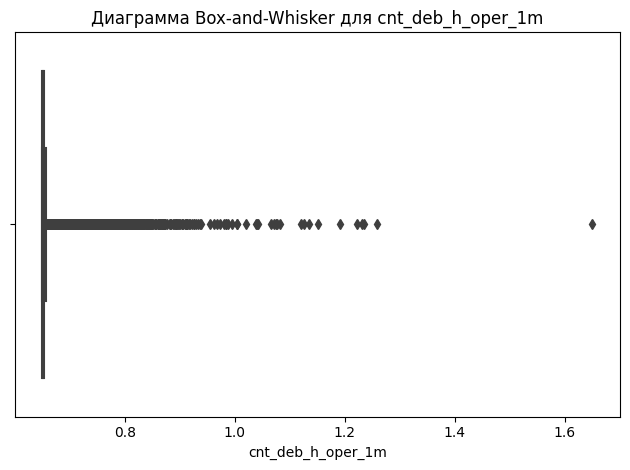

cnt_c_oper_3m


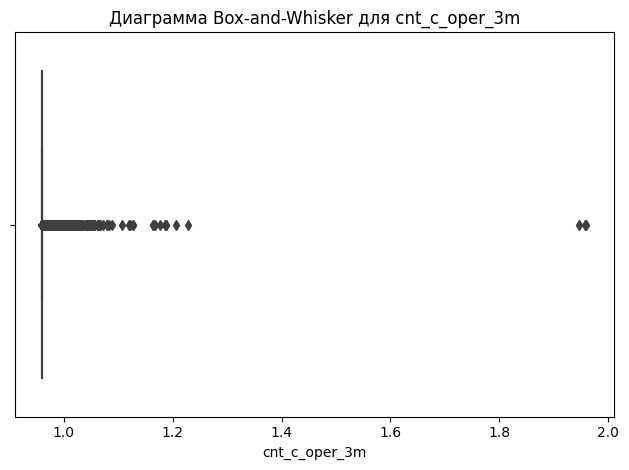

min_founderpres


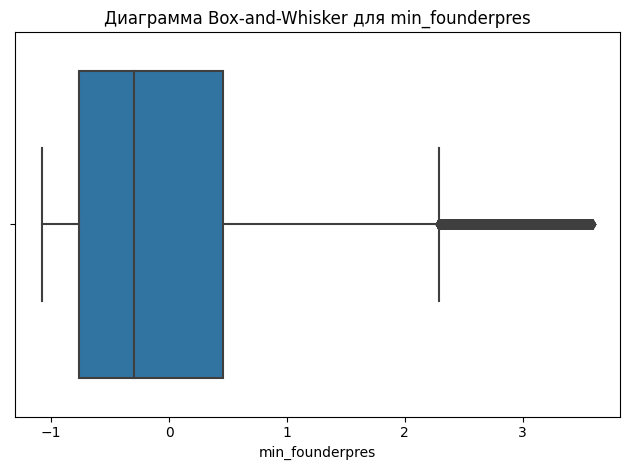

sum_deb_d_oper_1m


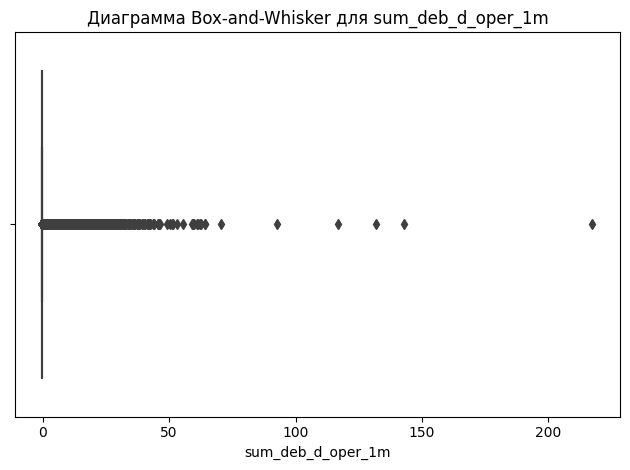

cnt_deb_g_oper_3m


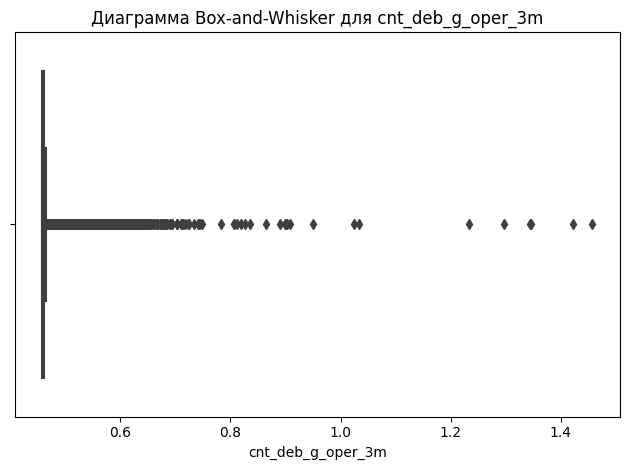

cnt_a_oper_3m


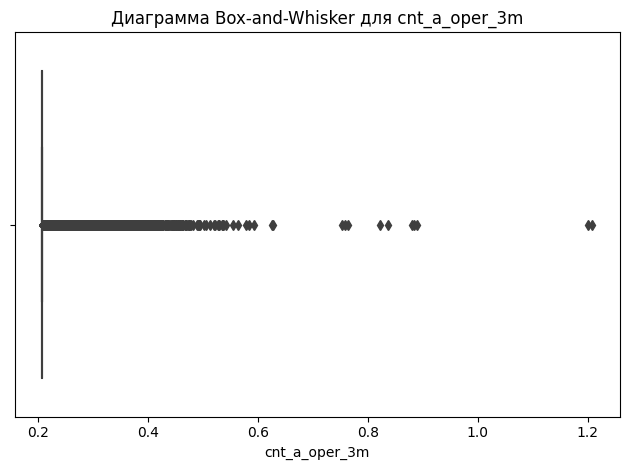

cnt_deb_e_oper_3m


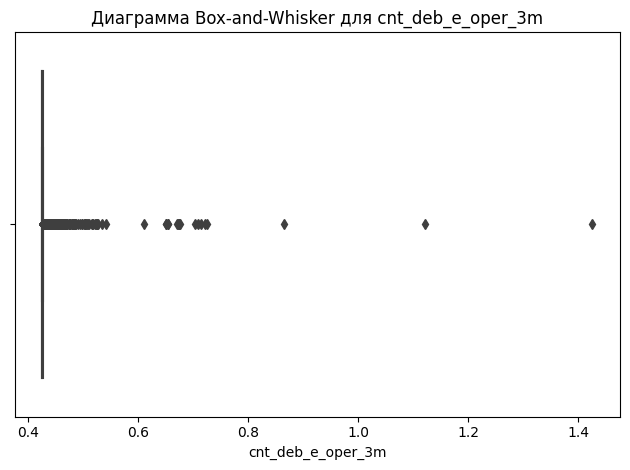

sum_deb_g_oper_3m


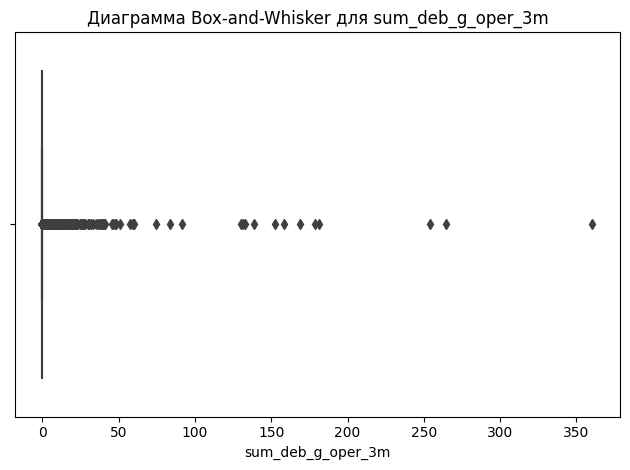

cnt_cred_h_oper_1m


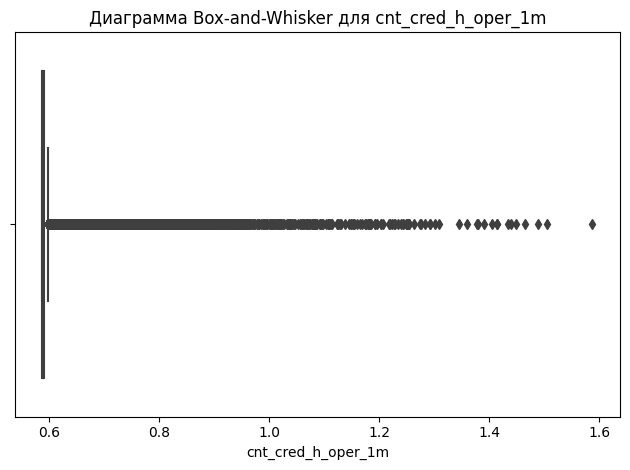

cnt_deb_d_oper_1m


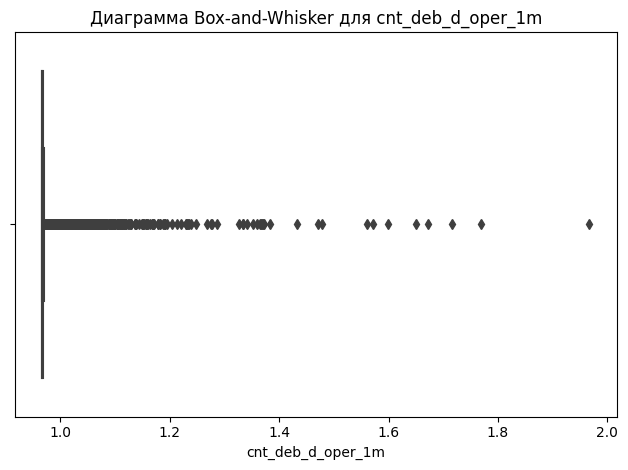

cnt_days_deb_h_oper_3m


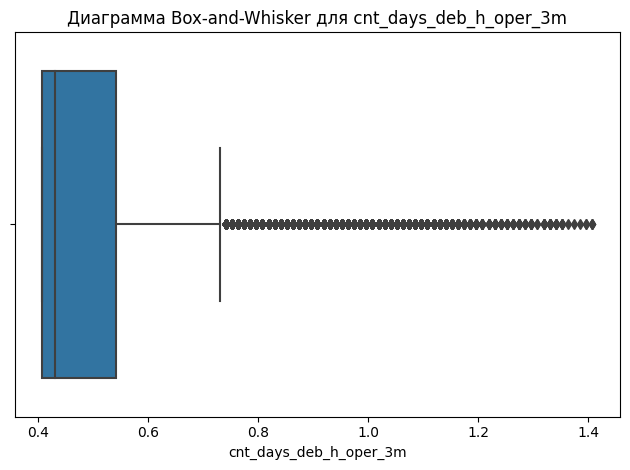

cnt_cred_h_oper_3m


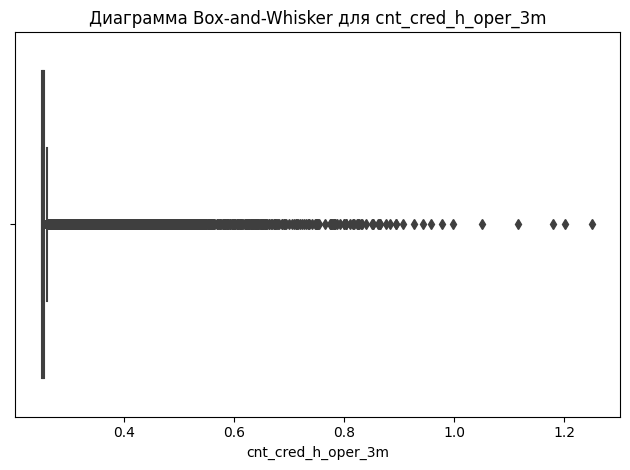

cnt_cred_f_oper_3m


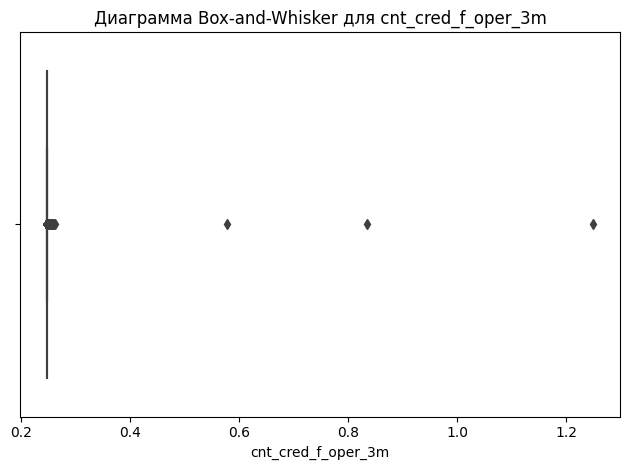

sum_deb_h_oper_1m


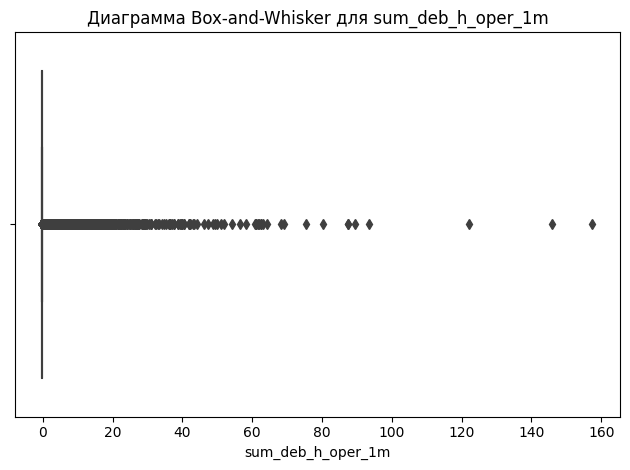

cnt_days_cred_f_oper_1m


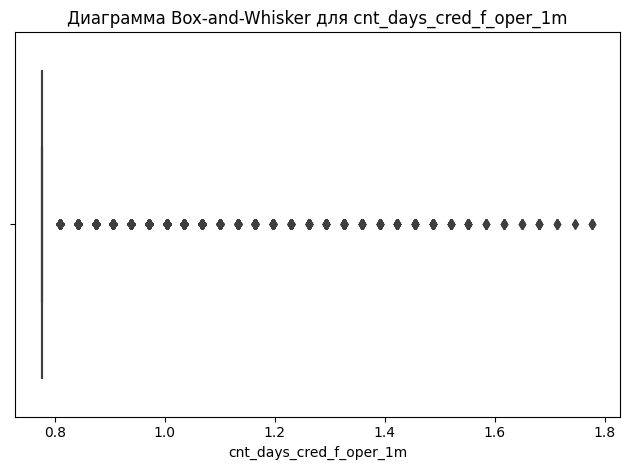

cnt_b_oper_3m


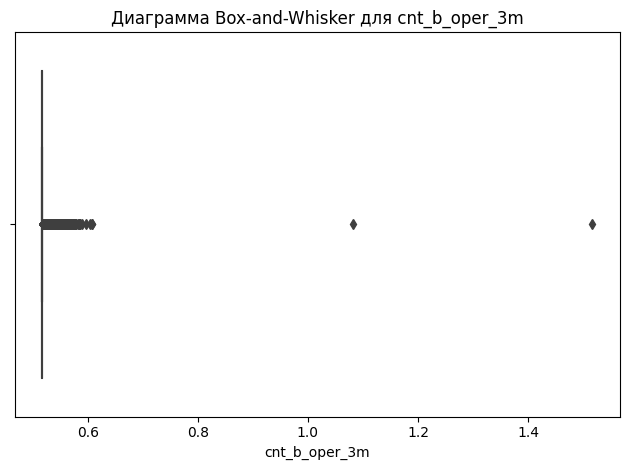

sum_cred_g_oper_3m


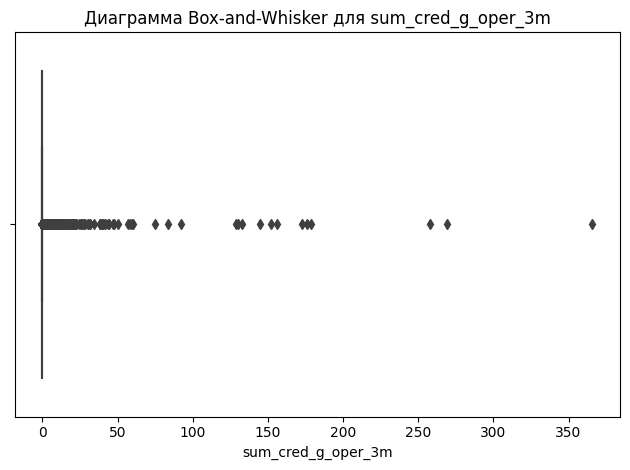

cnt_cred_e_oper_3m


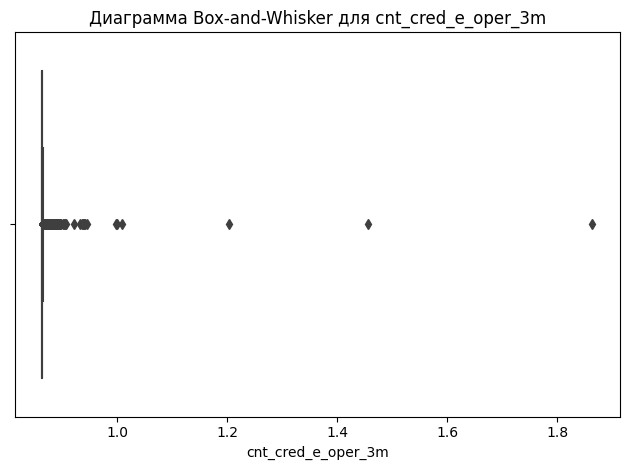

cnt_cred_f_oper_1m


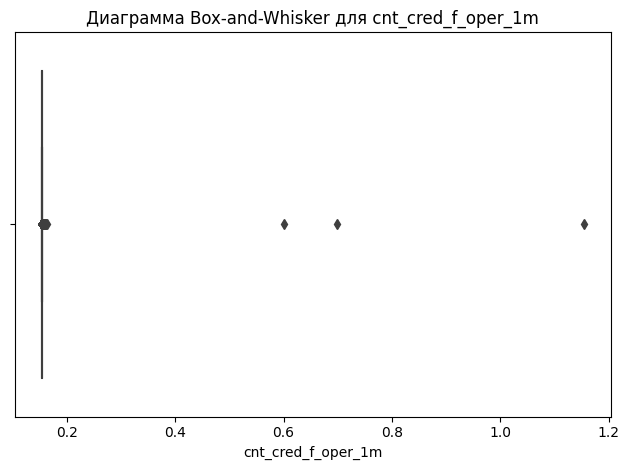

sum_c_oper_3m


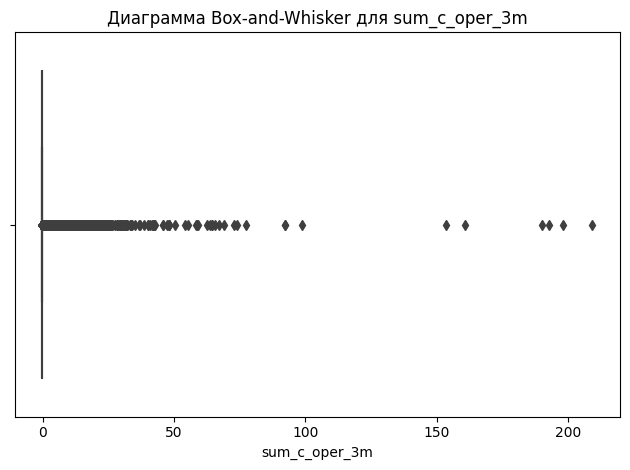

ogrn_days_end_quarter


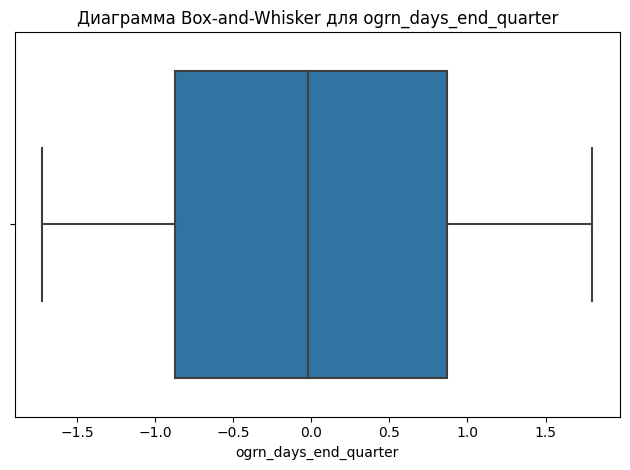

sum_deb_f_oper_3m


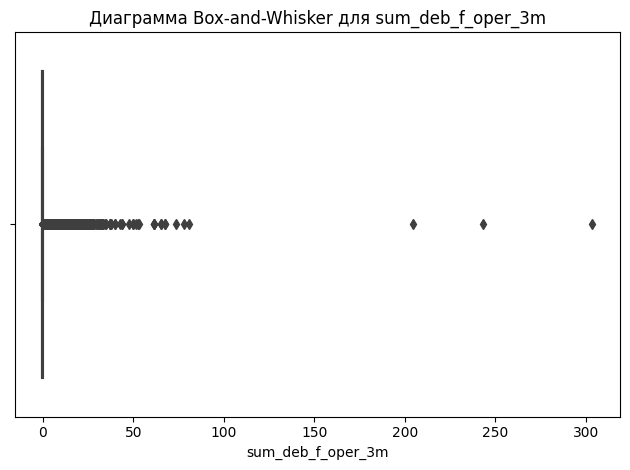

cnt_days_deb_h_oper_1m


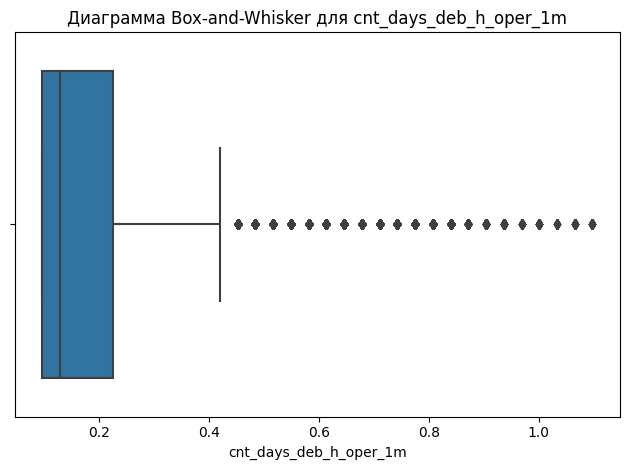

cnt_cred_d_oper_3m


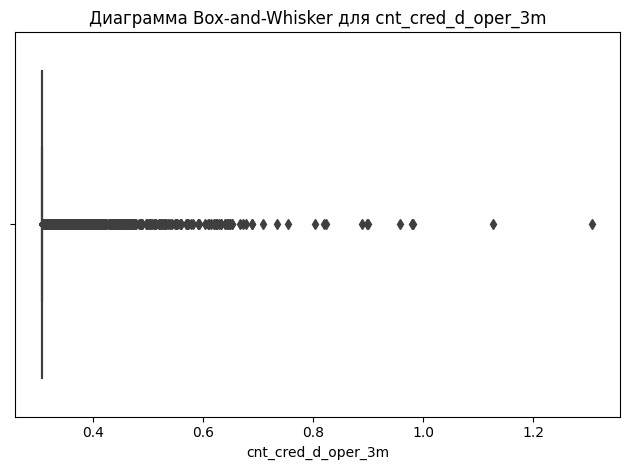

In [119]:
for col in set(train_df.columns) - set(cat_cols + ['date', 'end_cluster', 'start_cluster']):
    print(col)
    Box_and_Whisker(train_df, col)

### boxplot_features

In [120]:
def my_boxplot_features(x, y, df):
    sns.boxplot(x=x, y=y, data=df)
    plt.title(f'Диаграмма Box-and-Whisker для {y} по {x}')
    plt.xticks(rotation=45)
    


In [123]:
# Слишком долго выполняется

# for col in set(train_df.columns) - set(cat_cols + ['date', 'end_cluster', 'start_cluster']):
#     for col2 in set(cat_cols + ['date', 'end_cluster', 'start_cluster']):
#         print(col2, col)
#         my_boxplot_features(col2, col, train_df)

ft_registration_date end_cluster
ft_registration_date ogrn_year
ft_registration_date index_city_code
ft_registration_date date
ft_registration_date segment
ft_registration_date start_cluster
ft_registration_date channel_code
ft_registration_date city_type
ft_registration_date okved
ft_registration_date city
ft_registration_date ogrn_month
balance_amt_avg end_cluster
balance_amt_avg ogrn_year
balance_amt_avg index_city_code
balance_amt_avg date
balance_amt_avg segment
balance_amt_avg start_cluster
balance_amt_avg channel_code
balance_amt_avg city_type
balance_amt_avg okved
balance_amt_avg city
balance_amt_avg ogrn_month
sum_cred_g_oper_1m end_cluster
sum_cred_g_oper_1m ogrn_year
sum_cred_g_oper_1m index_city_code
sum_cred_g_oper_1m date
sum_cred_g_oper_1m segment
sum_cred_g_oper_1m start_cluster
sum_cred_g_oper_1m channel_code
sum_cred_g_oper_1m city_type
sum_cred_g_oper_1m okved
sum_cred_g_oper_1m city
sum_cred_g_oper_1m ogrn_month
sum_cred_e_oper_3m end_cluster
sum_cred_e_oper_3m ogrn

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x000002122E821A80> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000002122EDE5080> (for post_execute):


KeyboardInterrupt: 

### Корреляционные матрицы

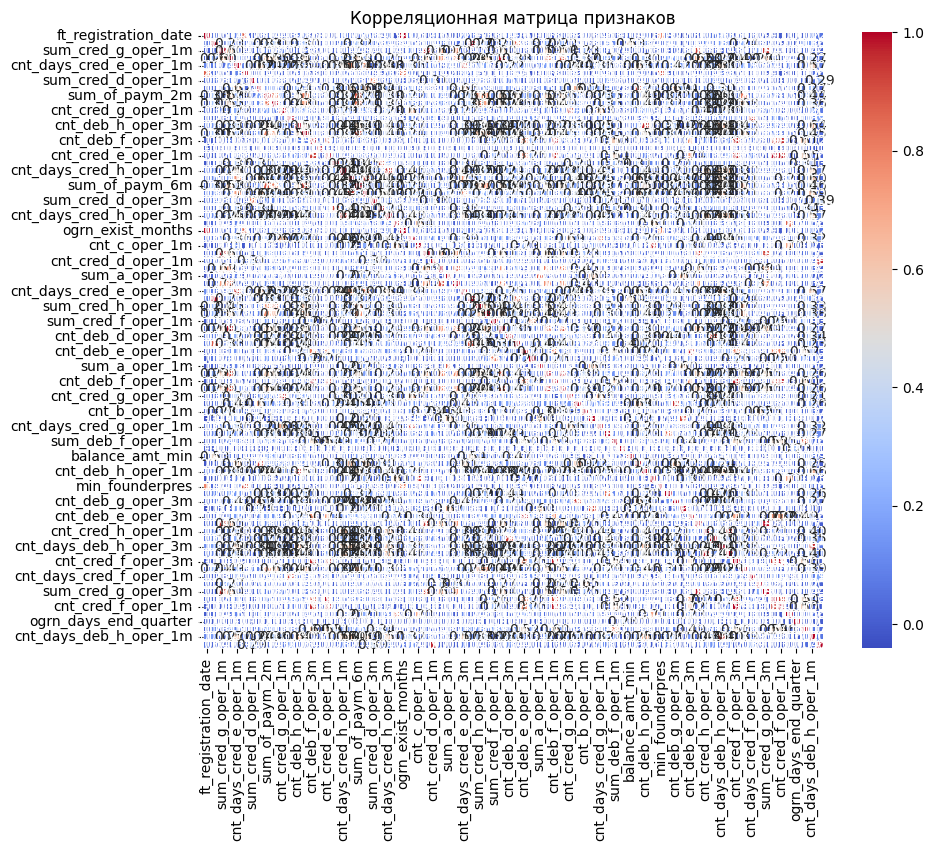

In [125]:
def show_correlation_matrix(df):
    correlation_matrix = df.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
    plt.title('Корреляционная матрица признаков')
    plt.show()
    
show_correlation_matrix(train_df[list(set(train_df.columns) - set(cat_cols + ['date', 'end_cluster', 'start_cluster']))])

### pairplot

In [126]:
# слишком долго работает
# sns.pairplot(train_df)
# plt.show()

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x000002122E821A80> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000002122EDE5080> (for post_execute):


KeyboardInterrupt: 

## Отобр оптимального признакового пространства для модели прогнозирования

### Корреляция числовых и бинарных признаков

In [127]:
# binary_variables = []

In [ ]:
# from scipy.stats import chi2_contingency
# from sklearn.feature_selection import SelectKBest, chi2

# def cramers_corrected_stat(binary_variables):
#     chi2 = chi2_contingency(confusion_matrix)[0]
#     n = confusion_matrix.sum().sum()
#     phi2 = chi2/n
#     r, k = confusion_matrix.shape
#     phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
#     rcorr = r - ((r-1)**2)/(n-1)
#     kcorr = k - ((k-1)**2)/(n-1)
#     return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

# cramers_v_results = {}

# for var1 in binary_variables:
#     for var2 in binary_variables:
#         if var1 != var2:  
#             confusion_matrix = pd.crosstab(train_df[var1], train_df[var2])
#             cramers_v_results[(var1, var2)] = cramers_corrected_stat(confusion_matrix)

# cramers_v_df = pd.DataFrame(list(cramers_v_results.items()), columns=['Variable Pair', 'Cramers V'])
# cramers_v_df.sort_values(by='Cramers V', ascending=False, inplace=True)

# cramers_v_df

In [ ]:
# cramers_v_df.describe()

### Используем регрессию Лассо (Lasso Regression) для оценки влияния различных значений параметра регуляризации alpha

In [ ]:
from sklearn.linear_model import Lasso
from labellines import *
from sklearn.preprocessing import StandardScaler

df_dropna = train_df[list(set(train_df.columns) - set(cat_cols + ['date', 'start_cluster']))].dropna()
X = df_dropna.drop('end_cluster', axis=1) 
Y = pd.get_dummies(df_dropna['end_cluster'])

X_sc = StandardScaler().fit_transform(X)
lg_l,pred_l = [], []

list_l=list(2**np.linspace(-10,10,100))

for i in range(len(list_l)):
    m_l = Lasso(alpha=list_l[i]).fit(X_sc, Y)
    lg_l.append(m_l)
    pred_l.append(m_l.coef_)

plt.figure(figsize=(12,9))
x_l = np.linspace(0,len(pred_l),len(pred_l))
k = 0
for i in np.vstack(pred_l).T:
    plt.plot(x_l,np.sign(i)*np.abs(i), label=str(X.columns[k])) 
    k += 1
# plt.ylim(-0.05,0.2)  
labelLines(plt.gca().get_lines(),zorder=2.5)
plt.legend(X.columns)     
plt.grid()
X_sc = StandardScaler().fit_transform(X)

## Востановить пропущенные значения

In [ ]:
from sklearn.impute import SimpleImputer  #импортируем библиотеку

myImputer = SimpleImputer(strategy= 'mean') #определяем импортер для обработки отсутствующих значений, используется стратегия замены средним значением

mean_data = df.copy()
indexes = (df['Температура'].isna() != True)&(df['Электроэнергия'].isna() != True)
mean_data[['Температура','Электроэнергия']]=myImputer.fit_transform(mean_data[['Температура','Электроэнергия']])
mean_data_train = mean_data[~indexes]
mean_data_test = mean_data[indexes]
print(mean_data_train.shape, mean_data_test.shape)

In [ ]:
median_data = df.copy()
myImputer = SimpleImputer(strategy= 'median')
median_data[['Температура','Электроэнергия']]=myImputer.fit_transform(median_data[['Температура','Электроэнергия']])
median_data_train = median_data[~indexes]
median_data_test = median_data[indexes]
print(median_data_train.shape, median_data_test.shape)

In [ ]:
most_frequent_data = df.copy()
myImputer = SimpleImputer (strategy= 'most_frequent') 
most_frequent_data[['Температура','Электроэнергия']]=myImputer.fit_transform(most_frequent_data[['Температура','Электроэнергия']])
most_frequent_data_train = most_frequent_data[~indexes]
most_frequent_data_test = most_frequent_data[indexes]
print(most_frequent_data_train.shape, most_frequent_data_test.shape)

In [ ]:
# KNNImputer_data = df.copy()

# # импортируем библиотеку

# from sklearn.impute import KNNImputer

# #определяем импортер

# imputer=KNNImputer(n_neighbors=1)

# #устанавливаем импортер на Х

# imputer.fit(KNNImputer_data)

# # восстанавливаем данные

# KNNImputer_data = imputer.transform(KNNImputer_data)

# # полученные данные преобразовываем в DataFrame

# KNNImputer_data = pd.DataFrame(KNNImputer_data,columns = df.columns)

In [ ]:
# KNNImputer_data.isna().sum()

In [ ]:
# KNNImputer_data_train = mean_data[~indexes]
# KNNImputer_data_test = mean_data[indexes]
# print(KNNImputer_data_train.shape, KNNImputer_data_test.shape)

In [ ]:
# X = new_data.copy(deep = True) #создаем копию датасета

# # импортируем библиотеку

# from sklearn.experimental import enable_iterative_imputer

# from sklearn.impute import IterativeImputer

# # определяем импортер

# myImputer=IterativeImputer()

# # устанавливаем imputer на X

# myImputer.fit(X) 

# #получаем восстановленные данные

# myImputer_data = myImputer.transform(X)

# # полученные данные преобразовываем в DataFrame

# myImputer_data = pd.DataFrame(myImputer_data,columns = new_data.columns)

## Формируем X_train, X_test, y_train, y_test

In [ ]:
from sklearn.model_selection import train_test_split

In [6]:
cat_cols = [
    "channel_code", "city", "city_type",
    "okved", "segment", "start_cluster",
    "index_city_code", "ogrn_month", "ogrn_year",
]

Обозначение категориальных признаков

In [7]:
train_df[cat_cols] = train_df[cat_cols].astype("category")
test_df[cat_cols] = test_df[cat_cols].astype("category")

Создаем выборки для валидации и обучения

In [ ]:
# Пример
def get_x_train_x_val_y_train_y_val_0(df_val, y_row):

    X = train_df.drop(["id", "date", "end_cluster"], axis=1)
    y = train_df["end_cluster"]

    x_train, x_val, y_train, y_val = train_test_split(X, y,
                                                      test_size=0.2,
                                                      random_state=42)

    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    y_train = scaler.transform(y_train)
    
    return x_train, x_val, y_train, y_val

In [61]:
cat_cols

['channel_code',
 'city',
 'city_type',
 'okved',
 'segment',
 'start_cluster',
 'index_city_code',
 'ogrn_month',
 'ogrn_year']

# Решение

## Оценки качества классификации

## Обучение модели

В качестве базовой модели возьмем LGBM обучим на всех признаках

In [9]:
model = LGBMClassifier(verbosity=-1, random_state=42, n_jobs=-1)
model.fit(x_train, y_train)

LGBMClassifier(n_jobs=-1, random_state=42, verbosity=-1)

Зададим функцию для взвешенной метрики roc auc

In [10]:
def weighted_roc_auc(y_true, y_pred, labels, weights_dict):
    unnorm_weights = np.array([weights_dict[label] for label in labels])
    weights = unnorm_weights / unnorm_weights.sum()
    classes_roc_auc = roc_auc_score(y_true, y_pred, labels=labels,
                                    multi_class="ovr", average=None)
    return sum(weights * classes_roc_auc)

In [12]:
cluster_weights = pd.read_excel("cluster_weights.xlsx").set_index("cluster")
weights_dict = cluster_weights["unnorm_weight"].to_dict()

Проверка работы модели

In [13]:
y_pred_proba = model.predict_proba(x_val)
y_pred_proba.shape

(120000, 17)

In [14]:
weighted_roc_auc(y_val, y_pred_proba, model.classes_, weights_dict)

0.7444442423902319

## Прогноз на тестовой выборке

In [15]:
test_df.pivot(index="id", columns="date", values="start_cluster").head(3)

date,month_4,month_5,month_6
id,,,
200000,{α},{α},NaN
200001,{α},{α},NaN
200002,{other},{other},NaN


Для того, чтобы сделать прогноз на тестовой выборке, нужно заполнить стартовый кластер. </br>
В качестве базового подхода заполним все стартовые кластеры, самым популярным кластером.

In [16]:
test_df["start_cluster"] = train_df["start_cluster"].mode()[0]
test_df["start_cluster"] = test_df["start_cluster"].astype("category")

In [17]:
sample_submission_df = pd.read_csv("sample_submission.csv")

In [18]:
sample_submission_df.shape

(100000, 18)

In [19]:
sample_submission_df.head()

,id,{other},{},"{α, β}","{α, γ}","{α, δ}","{α, ε, η}","{α, ε, θ}","{α, ε, ψ}","{α, ε}","{α, η}","{α, θ}","{α, λ}","{α, μ}","{α, π}","{α, ψ}",{α},{λ}
0,200000,0.2,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
1,200001,0.2,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
2,200002,0.2,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
3,200003,0.2,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05
4,200004,0.2,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05,0.05


Для тестовой выборки будем использовать только последний месяц

In [20]:
last_m_test_df = test_df[test_df["date"] == "month_6"]
last_m_test_df = last_m_test_df.drop(["id", "date"], axis=1)

In [21]:
test_pred_proba = model.predict_proba(last_m_test_df)
test_pred_proba_df = pd.DataFrame(test_pred_proba, columns=model.classes_)
sorted_classes = sorted(test_pred_proba_df.columns.to_list())
test_pred_proba_df = test_pred_proba_df[sorted_classes]

In [22]:
test_pred_proba_df.shape

(100000, 17)

In [23]:
test_pred_proba_df.head(2)

,{other},{},"{α, β}","{α, γ}","{α, δ}","{α, ε, η}","{α, ε, θ}","{α, ε, ψ}","{α, ε}","{α, η}","{α, θ}","{α, λ}","{α, μ}","{α, π}","{α, ψ}",{α},{λ}
0,0.009037,0.019459,0.023629,0.029170,0.002358,4.192651e-07,0.000004,0.0,0.002557,0.004227,0.032780,3.724246e-12,3.674365e-10,0.0,0.000029,0.876751,0.0
1,0.007198,0.607263,0.001753,0.004561,0.000000,4.162405e-05,0.000001,0.0,0.000906,0.009760,0.003958,2.419129e-10,6.797343e-05,0.0,0.000215,0.364275,0.0


In [24]:
sample_submission_df[sorted_classes] = test_pred_proba_df
sample_submission_df.to_csv("baseline_submission.csv", index=False)

## TODO

1. Заполнить пропуски

2. Сравнить между собой train и test например используя describe

3. 